This noteook will read in our different redshfit bin calibration methods and look at the distribution of logdistance ratios within galaxy clusters. In theory, these distributions should be symmetric within each given cluster.

January 28, 2025

In [5]:
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False
from matplotlib import cm, colors
from matplotlib.patches import Ellipse
import matplotlib as mpl

# We have more than 10 redshift bins, so we need to change the default color map so that they are all plotted with different colors
# from cycler import cycler
# plt.rcParams['axes.prop_cycle'] = cycler('color', plt.get_cmap('tab20').colors)

import ligo.skymap.plot

from astropy.table import Table, vstack, join
from astropy.coordinates import SkyCoord, Distance
from astropy.cosmology import Planck18, FlatLambdaCDM
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import SphericalCircle
from astropy import units as u
from astropy import constants as c
from astropy.io import fits

from cosmoprimo.fiducial import DESI

from scipy.spatial.distance import cdist, euclidean
import numpy as np
from astropy.table import Table
from astropy.cosmology import Planck18 as cosmo
from astropy.coordinates import SkyCoord
from scipy.spatial import cKDTree
import os

from corner import corner

import pickle

from sklearn.covariance import EllipticEnvelope
from matplotlib.patches import Ellipse
from scipy.stats import chi2, skew

from tqdm import tqdm
from hdbscan import HDBSCAN
from scipy.stats import binned_statistic
from matplotlib.projections import get_projection_names

from desiutil.plots import init_sky
import fitsio
# Custom functions / classes
import sys
# sys.path.insert(1, '/global/u1/k/kadglass/DESI_SGA/TF/')
# sys.path.insert(1, '/Users/kdouglass/Documents/Research/DESI/PV_survey/code/TF/')
sys.path.insert(1, '/global/u1/s/sgmoore1/DESI_SGA/TF/')
from help_functions import adjust_lightness
from line_fits import hyperfit_line_multi
from TF_photoCorrect import BASS_corr, MW_dust, k_corr, internal_dust
from z_CMB_convert import convert_z_frame
from help_functions import profile_histogram

# Read in the PV catalog

In [6]:
sgatab=Table.read('/pscratch/sd/s/sgmoore1/TF/cats/SGA_iron_jointTFR_v7-lowcal_syscorr.fits')
# sgatab=Table.read('/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/color_xonly_2color_catalog.fits')
sgatab[:5]

SGA_ID,SGA_GALAXY,GALAXY,PGC,RA_LEDA,DEC_LEDA,MORPHTYPE,PA_LEDA,D25_LEDA,BA_LEDA,Z_LEDA,SB_D25_LEDA,MAG_LEDA,BYHAND,REF,GROUP_ID,GROUP_NAME,GROUP_MULT,GROUP_PRIMARY,GROUP_RA,GROUP_DEC,GROUP_DIAMETER,BRICKNAME,RA,DEC,D26,D26_REF,PA,BA,RA_MOMENT,DEC_MOMENT,SMA_MOMENT,G_SMA50,R_SMA50,Z_SMA50,SMA_SB22,SMA_SB22.5,SMA_SB23,SMA_SB23.5,SMA_SB24,SMA_SB24.5,SMA_SB25,SMA_SB25.5,SMA_SB26,G_MAG_SB22,R_MAG_SB22,Z_MAG_SB22,G_MAG_SB22.5,R_MAG_SB22.5,Z_MAG_SB22.5,G_MAG_SB23,R_MAG_SB23,Z_MAG_SB23,G_MAG_SB23.5,R_MAG_SB23.5,Z_MAG_SB23.5,G_MAG_SB24,R_MAG_SB24,Z_MAG_SB24,G_MAG_SB24.5,R_MAG_SB24.5,Z_MAG_SB24.5,G_MAG_SB25,R_MAG_SB25,Z_MAG_SB25,G_MAG_SB25.5,R_MAG_SB25.5,Z_MAG_SB25.5,G_MAG_SB26,R_MAG_SB26,Z_MAG_SB26,SMA_SB22_ERR,SMA_SB22.5_ERR,SMA_SB23_ERR,SMA_SB23.5_ERR,SMA_SB24_ERR,SMA_SB24.5_ERR,SMA_SB25_ERR,SMA_SB25.5_ERR,SMA_SB26_ERR,G_MAG_SB22_ERR,R_MAG_SB22_ERR,Z_MAG_SB22_ERR,G_MAG_SB22.5_ERR,R_MAG_SB22.5_ERR,Z_MAG_SB22.5_ERR,G_MAG_SB23_ERR,R_MAG_SB23_ERR,Z_MAG_SB23_ERR,G_MAG_SB23.5_ERR,R_MAG_SB23.5_ERR,Z_MAG_SB23.5_ERR,G_MAG_SB24_ERR,R_MAG_SB24_ERR,Z_MAG_SB24_ERR,G_MAG_SB24.5_ERR,R_MAG_SB24.5_ERR,Z_MAG_SB24.5_ERR,G_MAG_SB25_ERR,R_MAG_SB25_ERR,Z_MAG_SB25_ERR,G_MAG_SB25.5_ERR,R_MAG_SB25.5_ERR,Z_MAG_SB25.5_ERR,G_MAG_SB26_ERR,R_MAG_SB26_ERR,Z_MAG_SB26_ERR,G_COG_PARAMS_MTOT,G_COG_PARAMS_M0,G_COG_PARAMS_ALPHA1,G_COG_PARAMS_ALPHA2,G_COG_PARAMS_CHI2,R_COG_PARAMS_MTOT,R_COG_PARAMS_M0,R_COG_PARAMS_ALPHA1,R_COG_PARAMS_ALPHA2,R_COG_PARAMS_CHI2,Z_COG_PARAMS_MTOT,Z_COG_PARAMS_M0,Z_COG_PARAMS_ALPHA1,Z_COG_PARAMS_ALPHA2,Z_COG_PARAMS_CHI2,ELLIPSEBIT,Z_DESI,ZERR_DESI,V_0p4R26,V_0p4R26_ERR,PHOTSYS,D26_kpc,DIST_MAX,MAX_VOL_FRAC,Z_DESI_CMB,MORPHTYPE_AI,JOHN_VI,G_MAG_SB26_CORR,R_MAG_SB26_CORR,Z_MAG_SB26_CORR,G_MAG_SB26_ERR_CORR,R_MAG_SB26_ERR_CORR,Z_MAG_SB26_ERR_CORR,MU_ZCMB,R_ABSMAG_SB26,MU_ZCMB_ERR,R_ABSMAG_SB26_ERR,GOOD_MORPH,R_ABSMAG_SB26_TF,R_ABSMAG_SB26_TF_ERR,R_ABSMAG_SB26_TF_ERR_STAT,R_ABSMAG_SB26_TF_ERR_SYS,MU_TF,MU_TF_ERR,LOGDIST,LOGDIST_ERR,OUTLIER,MAIN
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,kpc,kpc,,,,,,,,,,,mag,,mag,,,,,,,,,mag,mag,,
float64,bytes16,bytes29,int64,float64,float64,bytes21,float32,float32,float32,float32,float32,float32,bool,bytes13,int64,bytes35,int16,bool,float64,float64,float32,bytes8,float64,float64,float32,bytes4,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float64,float64,float64,float64,bytes1,float64,float64,float64,float64,bytes10,bytes6,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,float64,float64,float64,bool,bool
38.0,SGA-2020 38,SDSSJ140638.88+393138.1,3558705,211.66194,39.5272341,S?,81.63,0.35318315,0.37757218,0.08108376,24.72948,18.361,False,LEDA-20181114,12,SDSSJ140638.88+393138.1,1,True,211.66194,39.5272341,0.35318315,2115p395,211.66203166014844,39.52724032794356,0.41757938,SB26,82.21093,0.41431504,211.6619547015994,39.52729608884245,8.520181,5.252184,4.0750155,3.3951538,3.3006833,4.4037066,5.5453897,6.693271,7.8023033,8.999919,10.213078,11.41192,12.527382,19.246052,18.406073,17.931826,18.841032,18.092857,17.659027,18.566164,17.886087,17.47688,18.383362,17.749825,17.355968,18.261652,17.655558,17.284552,18.168955,17.588947,17.231817,18.101948,17.547142

In [7]:
# Base values for later conversions (all in units in km/s).
c_kms = c.c.to_value('km/s')

h = 1.
H0 = 100*h

q0 = 0.2

In [79]:
Planck18_h = FlatLambdaCDM(H0=100, Om0=0.3151)

# Access Cluster Catalogs

These clusters come from the group catalog used by Kourkchi et al. in [*CosmicFlows-4: The Calibration of Optical and Infrared Tully-Fisher Relations*](https://iopscience.iop.org/article/10.3847/1538-4357/ab901c), ApJ 896:3, 2020.

Cluster membership is defined as
1. $R_p < 1.5R_{2t}$ AND $v < V_c \pm 3\sigma_v$, OR
1. $1.5R_{2t} \leq R_p < 3R_{2t}$ AND $v < V_c \pm 2\sigma_v$

where $R_p$ is the projected distance from the center of the cluster, $R_{2t}$ is the projected cluster second turnaround radius, $\sigma_v$ is the velocity dispersion of the cluster, and $V_c$ is the average heliocentric radial velocity of the cluster.

In [8]:
clusters_T = Table.read('../../Tully15-Table3.fits')
clusters_T[:5]

f_Nest,Nest,Nmb,PGC1,SGLON,SGLAT,logLK,<Vcmba>,DM,sigV,R2t,sigP,Mlum,CF
,,,,deg,deg,[Lsun],km / s,mag,km / s,Mpc,km / s,Msun,
int16,int32,int16,int32,float64,float64,float64,int32,float64,int16,float64,int16,float64,float64
1,100001,136,44715,89.6226,8.1461,13.15,7331,34.33,886,2.129,1045,1.710e+15,1.65
1,100002,197,41220,103.0008,-2.3248,12.69,1491,30.87,670,1.440,707,5.290e+14,1.00
1,100003,113,43296,156.2336,-11.5868,12.75,3873,32.94,822,1.520,746,6.230e+14,1.12
1,100004,81,58265,71.5103,49.7851,13.16,9424,34.87,740,2.153,1057,1.770e+15,2.26
1,100005,61,36487,92.0255,-10.4950,12.78,6987,34.22,707,1.560,766,6.730e+14,1.58


In [9]:
# Convert Tully's central cluster velocities to heliocentric frame (to match the DESI redshift frame)
cls_coords = SkyCoord(clusters_T['SGLON'], clusters_T['SGLAT'], unit='deg', frame='supergalactic').icrs
z_hel = convert_z_frame(clusters_T['<Vcmba>']/c.c.to('km/s'), cls_coords.ra.deg, cls_coords.dec.deg, corrtype='-full')
clusters_T['HRV'] = z_hel*c_kms
clusters_T[:5]

f_Nest,Nest,Nmb,PGC1,SGLON,SGLAT,logLK,<Vcmba>,DM,sigV,R2t,sigP,Mlum,CF,HRV
,,,,deg,deg,[Lsun],km / s,mag,km / s,Mpc,km / s,Msun,,
int16,int32,int16,int32,float64,float64,float64,int32,float64,int16,float64,int16,float64,float64,float64
1,100001,136,44715,89.6226,8.1461,13.15,7331,34.33,886,2.129,1045,1.710e+15,1.65,7056.410096941048
1,100002,197,41220,103.0008,-2.3248,12.69,1491,30.87,670,1.440,707,5.290e+14,1.00,1161.7922735623201
1,100003,113,43296,156.2336,-11.5868,12.75,3873,32.94,822,1.520,746,6.230e+14,1.12,3587.4600297854763
1,100004,81,58265,71.5103,49.7851,13.16,9424,34.87,740,2.153,1057,1.770e+15,2.26,9399.655364870352
1,100005,61,36487,92.0255,-10.4950,12.78,6987,34.22,707,1.560,766,6.730e+14,1.58,6653.443936152573


In [10]:
clusters_K = Table.read('../../Kourkchi17-Table2.fits.gz')
clusters_K[:5]

PGC1,PGC1+,Nm,GLON,GLAT,SGLON,SGLAT,Ksmag,logK,HRV,VLS,Nd,Dist,e_Dist,sigmaL,sigmaV,R2t,Rg,logMK,logMd
,,,deg,deg,deg,deg,mag,[Lsun],km / s,km / s,,Mpc,%,km / s,km / s,Mpc,Mpc,[Msun],[Msun]
int32,int32,int16,float64,float64,float64,float64,float64,float64,int16,int16,int16,float64,int16,int16,int16,float64,float64,float64,float64
43296,43296,191,302.2241,21.6465,156.3251,-11.5819,4.61,12.71,3407,3142,59,36.96,3,595,800,1.612,0.893,14.624,14.717
46618,43296,30,307.8738,19.2865,159.6426,-6.8008,6.07,12.11,3340,3086,5,37.57,7,350,307,0.950,0.745,13.936,13.808
45174,43296,34,306.0424,32.5707,146.1941,-6.0422,6.42,11.96,3292,3059,4,44.03,8,307,300,0.833,0.693,13.764,13.756
40498,43296,24,297.5648,23.0823,153.9019,-15.4648,6.48,11.92,3258,2986,4,28.45,6,296,170,0.801,0.607,13.713,13.207
43557,43296,22,302.9333,36.4075,141.8602,-7.7062,6.82,11.81,3296,3066,7,39.89,8,267,163,0.724,0.428,13.582,13.017


In [11]:
# Rename columns to match Tully's catalog
clusters_K['Nm'].name = 'Nmb'
clusters_K['sigmaL'].name = 'sigP'
clusters_K['sigmaV'].name = 'sigV'

# Convert from distance to distance modulus
clusters_K['DM'] = 5*np.log10(clusters_K['Dist'].value) + 25

# Define NestID
clusters_K['Nest'] = np.char.add('3', clusters_K['PGC1'].astype('str')).astype('int')

/tmp/ipykernel_725117/1224197170.py:7: RuntimeWarning: divide by zero encountered in log10
  clusters_K['DM'] = 5*np.log10(clusters_K['Dist'].value) + 25


## Combine the two cluster catalogs

We are going to keep the properties from Kourkchi's catalog when possible (as it is an updated version of Tully's).

In [12]:
# Determine which clusters in Kourkchi's table are already in Tully's
K_keep = np.ones(len(clusters_T), dtype=bool)

for i in range(len(clusters_K)):
    K_keep = K_keep & (clusters_T['PGC1'] != clusters_K['PGC1'][i])

clusters_all = vstack([clusters_T[K_keep], clusters_K])

clusters = clusters_all['Nest', 'Nmb', 'PGC1', 'SGLON', 'SGLAT', 'DM', 'sigV', 'sigP', 'R2t', 'HRV'][clusters_all['Nmb'] >= 5]
len(clusters)

1321

# Find Cluster Membership

Identify SGA galaxies in the list of galaxy groups from Tully (2015) and Kourkchi et al. (2017).

Loop through the data and keep only clusters where DESI has at least 10 galaxies with TF measurements passing all quality cuts.

In [13]:
#- Sky coordinates of SGA galaxies that passed quality selection
# sgatab_sel = sgatab[sgatab['MAIN']]
sgatab_sel = sgatab

sga_coords = SkyCoord(sgatab_sel['RA'], sgatab_sel['DEC'], unit='deg')
z_sga_desi = sgatab_sel['Z_DESI']

In [14]:
sga_clusters = {}
n_cluster_min = 8

#- Convert distance moduli to velocities [in km/s]
velos = 100 * 10**(0.2*(clusters['DM'] - 25)) / (1 + clusters['HRV']/c_kms)
# Tully used H0 = 100 km/s/Mpc, which is why we are using 100 here and not H0

for i in tqdm(range(len(clusters))):
    nest_id = clusters['Nest'][i]
    
    #- Sky coordinates of cluster
    cls_coord = SkyCoord(clusters['SGLON'][i], 
                         clusters['SGLAT'][i], 
                         unit='deg', 
                         frame='supergalactic')

    #- Cluster turnaround radius, velocity dispersion, and distance modulus
    R2t = clusters['R2t'][i]
    sigV = clusters['sigV'][i]
    velo = velos[i]

    #- Apply cuts on angular separation
    sep = cls_coord.separation(sga_coords)
    R2t_angle_1p5 = np.arctan(1.5*R2t / (velo/H0)) * u.radian
    R2t_angle_3 = np.arctan(3*R2t / (velo/H0)) * u.radian

    #- Apply cluster cuts.
    in_cluster_1 = (sep < R2t_angle_1p5) & (z_sga_desi*c_kms > velo - 3*sigV) & (z_sga_desi*c_kms < velo + 3*sigV)
    in_cluster_2 = (sep >= R2t_angle_1p5) & (sep < R2t_angle_3) & (z_sga_desi*c_kms > velo - 2*sigV) & (z_sga_desi*c_kms < velo + 2*sigV)
    in_cluster = in_cluster_1 | in_cluster_2

    if np.any(in_cluster) and np.sum(in_cluster) >= n_cluster_min:
        if nest_id in sga_clusters:
            warnings.warn(f'Cluster ID {nest_id} already encountered.', RuntimeWarning)
        sga_clusters[nest_id] = list(sgatab_sel['SGA_ID'][in_cluster])

 78%|███████▊  | 1025/1321 [00:07<00:02, 109.10it/s]/tmp/ipykernel_725117/4124608388.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  R2t_angle_1p5 = np.arctan(1.5*R2t / (velo/H0)) * u.radian
/tmp/ipykernel_725117/4124608388.py:25: RuntimeWarning: divide by zero encountered in scalar divide
  R2t_angle_3 = np.arctan(3*R2t / (velo/H0)) * u.radian
100%|██████████| 1321/1321 [00:11<00:00, 119.70it/s]


In [15]:
for i, (cluster_id, sga_ids) in enumerate(sga_clusters.items()):
    print(f'{i+1:2d} {cluster_id:7d} {len(sga_ids):3d} galaxies')

 1  100004  13 galaxies
 2  100007  24 galaxies
 3  100015   8 galaxies
 4  100041  10 galaxies
 5  100042  25 galaxies
 6  100046  18 galaxies
 7  100051  13 galaxies
 8  100058  24 galaxies
 9  100067  44 galaxies
10  100071  12 galaxies
11  100077  26 galaxies
12  100081  22 galaxies
13  100094  20 galaxies
14  100102  18 galaxies
15  100126   9 galaxies
16  100132  13 galaxies
17  100135   8 galaxies
18  100137  13 galaxies
19  100168  16 galaxies
20  100176   9 galaxies
21  100191  11 galaxies
22  100203   9 galaxies
23  100207  11 galaxies
24  100221  54 galaxies
25  100237  14 galaxies
26  100282  42 galaxies
27  100300  13 galaxies
28  100312  10 galaxies
29  100385  13 galaxies
30  100404   8 galaxies
31  100408  19 galaxies
32  100479   8 galaxies
33  103327  11 galaxies
34  200011  11 galaxies
35  200023  20 galaxies
36  200052  10 galaxies
37  200075   8 galaxies
38  341220  60 galaxies
39  341789  14 galaxies
40  340001   9 galaxies
41  341618  10 galaxies
42  353932   8 g

## Sanity Checks: Plot Cluster Positions and Galaxy Coordinates

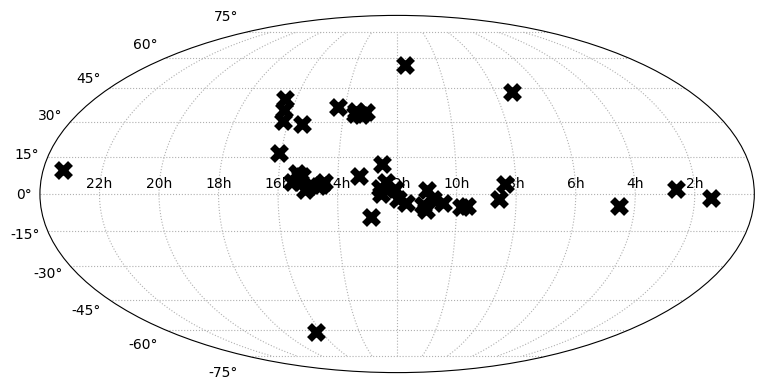

In [16]:
nest_ids = np.asarray(list(sga_clusters.keys()))
idx = np.in1d(clusters['Nest'], nest_ids)
cluster_lon = clusters['SGLON'][idx]
cluster_lat = clusters['SGLAT'][idx]
cluster_coords = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic')

fig, ax = plt.subplots(figsize=(10,4), tight_layout=True, subplot_kw={'projection' : 'mollweide'})
for coord in cluster_coords:
    _ra = np.radians(180*u.deg - coord.transform_to('icrs').ra)
    _dec = np.radians(coord.transform_to('icrs').dec)
    ax.plot(_ra, _dec, 'kx', ms=10, mew=5)

ax.set(xticklabels=[f'{_}h' for _ in np.arange(2,24, 2)][::-1])
ax.grid(ls=':');

# fig.savefig('../../Figures/Y1/TF_Y1_SGA_Vrot_clusters_20241203.png', dpi=150);

In [17]:
def geometric_median(X, eps=1e-6):
    """Compute the weighted geometric median of a set of points using Weiszfeld's algorithm.

    From https://github.com/scoutant/l1-median. Weiszfeld's algorithm may fail to converge
    if a guess is located on top of one of the initial points. If that occurs, move the guess.
    
    A summary of other algorithms is provided in
    https://www.cs.cmu.edu/~./glmiller/Publications/Papers/CLMPS16.pdf.

    Parameters
    ----------
    X : ndarray
        list of sample points (n-D), given as a 2D array
    eps : float
        Tolerance for convergence to the median.

    Returns
    -------
    y : ndarray
        First n-D estimate of the median satisfying the tolerance.
    """
    #- See with the geometric mean
    y = np.mean(X,0)
    while True:
        #- Compute Euclidean distances. Move away to avoid any null distances.
        while np.any(cdist(X,[y])==0):
            y +=0.1*np.ones(len(y))
            
        #- Weights that are the inverse of the distances from current estimate to the observations
        W = 1/cdist(X,[y]) # element-wise
        
        #- Update is the weighted average of the observations
        y1 = np.sum(W*X,0)/np.sum(W) # sum along axis 0
        if euclidean(y,y1) < eps:
            return y1
        y = y1

def cluster_median_coords(galaxy_coords):
    """Compute the geometric median coordinate of the galaxies in a cluster.

    Parameters
    ----------
    galaxy_coords : ndarray
        List of SkyCoords for galaxies in a cluster or group.

    Returns
    -------
    gal_median : SkyCoord
        Coordinates of the geometric median.
    """
    #- Pack the clusters coordinates into an array of Cartesian coordinates
    galcoords = []
    for galaxy in galaxy_coords:
        galcoords.append(galaxy.represent_as('cartesian').get_xyz())
    galcoords = np.asarray(galcoords)

    #- Compute the geometric median.
    gm = geometric_median(galcoords)
    lonlat = SkyCoord(x=gm[0], y=gm[1], z=gm[2], representation_type='cartesian').transform_to('icrs').represent_as('unitspherical')
    gal_median = SkyCoord(ra=lonlat.lon.deg, dec=lonlat.lat.deg, unit='degree', frame='icrs')

    return gal_median

In [18]:
def plot_cluster_members(clusters, cluster_id, sgacat, sga_ids):
    """Generate a set of diagnostic plots for the members of a cluster.
    """
    
    #- Get cluster sky coordinates
    # idx = np.in1d(clusters['Nest'], cluster_id)
    idx = clusters['Nest'] == cluster_id
    cluster_lon = clusters['SGLON'][idx][0]
    cluster_lat = clusters['SGLAT'][idx][0]
    cluster_mu = clusters['DM'][idx][0]
    cluster_hrv = clusters['HRV'][idx][0]
    cluster_v = 100 * 10**(0.2*(cluster_mu - 25)) / (1 + cluster_hrv/c_kms)
    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]
    cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian
    
    cluster_coord = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic').transform_to('icrs')

    print(cluster_coord)
    print(f'{cluster_v} +/- {cluster_sigma} km/s')

    #- Get SGA galaxy coordinates and median of observations
    # idx = np.in1d(sgacat['SGA_ID'], sga_ids)
    idx = np.isin(sgacat['SGA_ID'], sga_ids)
    z_sga = sgacat['Z_DESI'][idx]
    z_sorted = np.sort(z_sga)
    ngal = len(z_sorted)
    z_sga_median = np.mean(z_sorted[ngal//2:ngal//2 + 2]) if (ngal % 2 == 0) else z_sorted[ngal//2]
    
    sga_coords = SkyCoord(ra=sgacat['RA'][idx], dec=sgacat['DEC'][idx], unit='deg', frame='icrs')
    sga_coords_median = cluster_median_coords(sga_coords)

    #- Plot the angular coordinates and redshifts
    fig = plt.figure(figsize=(12,8), tight_layout=True)
    ax = plt.subplot(231, projection='astro degrees zoom', center=cluster_coord, radius=cluster_R2t_4)
    ax.grid()

    ax.plot(sga_coords.ra.deg, sga_coords.dec.deg, 'o', transform=ax.get_transform('world'), alpha=0.5, label=f'{cluster_id}')
    ax.plot(sga_coords_median.ra.deg, sga_coords_median.dec.deg, 'rD', transform=ax.get_transform('world'), ms=5, mew=5)
    ax.plot(cluster_coord.ra.deg, cluster_coord.dec.deg, 'kx', transform=ax.get_transform('world'), ms=10, mew=5)

    inner = SphericalCircle(cluster_coord, cluster_R2t_1p5, 
                            transform=ax.get_transform('world'), 
                            edgecolor='tab:blue', 
                            linestyle='dotted', 
                            facecolor='none')
    ax.add_patch(inner)

    outer = SphericalCircle(cluster_coord, cluster_R2t_3, 
                            transform=ax.get_transform('world'), 
                            edgecolor='tab:blue', 
                            linestyle='solid', 
                            facecolor='none')
    ax.add_patch(outer)
    
    ax.set(xlabel=r'$\alpha$ [deg]', ylabel=r'$\delta$ [deg]')

    #- Plot the Dec vs redshift and velocity limits
    ax = plt.subplot(232)
    ax.plot(z_sga, sga_coords.dec.deg, 'o', alpha=0.5, label=f'{cluster_id}')
    ax.plot(z_sga_median, sga_coords_median.dec.deg, 'rD', ms=5, mew=5)
    ax.plot(cluster_v/c_kms, cluster_coord.dec.deg, 'kx', ms=10, mew=5)

    decmin = np.min(sga_coords.dec.deg) - 0.5
    decmax = np.max(sga_coords.dec.deg) + 0.5

    ax.vlines(np.asarray([cluster_v-3*cluster_sigma,
                          cluster_v+3*cluster_sigma,
                          cluster_v-2*cluster_sigma,
                          cluster_v+2*cluster_sigma])/c_kms,
              decmin, decmax,
              colors='tab:blue',
              linestyles=['dotted', 'dotted', 'solid', 'solid'])

    ax.set(xlabel='redshift',
           ylabel=r'$\delta$ [deg]',
           ylim=(decmin, decmax))

    #- Plot the RA vs redshift and velocity limits
    ax = plt.subplot(233)
    ax.plot(sga_coords.ra.deg, z_sga, 'o', alpha=0.5, label=f'{cluster_id}')
    ax.plot(sga_coords_median.ra.deg, z_sga_median, 'rD', ms=5, mew=5)
    ax.plot(cluster_coord.ra.deg, cluster_v/c_kms, 'kx', ms=10, mew=5)

    ramin = np.min(sga_coords.ra.deg) - 0.5
    ramax = np.max(sga_coords.ra.deg) + 0.5

    ax.hlines(np.asarray([cluster_v-3*cluster_sigma,
                          cluster_v+3*cluster_sigma,
                          cluster_v-2*cluster_sigma,
                          cluster_v+2*cluster_sigma])/c_kms,
              ramin, ramax,
              colors='tab:blue',
              linestyles=['dotted', 'dotted', 'solid', 'solid'])

    ax.set(ylabel='redshift',
           xlabel=r'$\alpha$ [deg]',
           xlim=(ramax, ramin))

    #- Histograms of RA, Dec, and redshift:
    delta_angle = 0.75
    
    ax = plt.subplot(234)
    ax.hist(sga_coords.ra.deg, bins=np.arange(ramin, ramax+delta_angle, delta_angle))
    ax.vlines(sga_coords_median.ra.deg, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_coord.ra.deg, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel=r'$\alpha$ [deg]',
           xlim=(ramax+delta_angle, ramin-delta_angle),
           ylabel='count',
           ylim=(0,10))

    ax = plt.subplot(235)
    ax.hist(sga_coords.dec.deg, bins=np.arange(decmin, decmax+delta_angle, delta_angle))
    ax.vlines(sga_coords_median.dec.deg, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_coord.dec.deg, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel=r'$\delta$ [deg]',
           xlim=(decmax+delta_angle, decmin-delta_angle),
           ylabel='count',
           ylim=(0,10))

    dz = 0.0025
    zmin = np.min(np.round(z_sga, 2)) - 4*dz
    zmax = np.max(np.round(z_sga, 2)) + 4*dz

    ax = plt.subplot(236)
    ax.hist(z_sga, bins=np.arange(zmin, zmax + dz, dz))
    ax.vlines(z_sga_median, 0, 50, colors='r', linestyles='dotted')
    ax.vlines(cluster_v/c_kms, 0, 50, colors='k', linestyles='dotted')
    ax.set(xlabel='redshift',
           xlim=(zmin, zmax),
           ylabel='count',
           ylim=(0,10))

    fig.suptitle(f'TF Iron Observations of Tully Group {cluster_id}')

    return fig

<SkyCoord (ICRS): (ra, dec) in deg
    (246.98584602, 40.22479396)>
9132.55497474448 +/- 740 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (241.05808519, 16.95441739)>
11159.278092517916 +/- 1261 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (193.16277283, -9.25359807)>
4486.734665583065 +/- 387 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (244.29362068, 35.02777805)>
9133.042696166442 +/- 589 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (220.13676059, 3.3706831)>
8208.566499393248 +/- 451 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (230.75880839, 8.56052159)>
10536.350082571193 +/- 737 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (203.55537441, 34.64649124)>
7538.175450827387 +/- 268 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (164.76646719, 1.62439612)>
12149.868663444906 +/- 326 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (228.80657754, 4.74840124)>
11162.429001608842 +/- 763 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (181.12024342, 1.88984499)>
6242.6637780276515 +/- 358 km/s
<SkyCoord (

/tmp/ipykernel_725117/287557158.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,8), tight_layout=True)


<SkyCoord (ICRS): (ra, dec) in deg
    (203.84290263, 33.22979277)>
7504.132244303757 +/- 183 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (175.41038787, -3.83222093)>
16808.924434527566 +/- 2083 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (157.01415438, -3.5499741)>
9390.937491283488 +/- 393 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (232.05444778, 29.03388829)>
19540.52759050142 +/- 1960 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (166.79383597, -4.64785571)>
11885.648273495597 +/- 485 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (216.69616323, 4.86548588)>
8357.943707491857 +/- 310 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (128.60310526, -2.20051154)>
11569.626964093302 +/- 494 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (233.23768721, 4.76971232)>
11411.467754942172 +/- 344 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (161.78431207, -1.90513653)>
11419.919551894302 +/- 320 km/s
<SkyCoord (ICRS): (ra, dec) in deg
    (179.50303042, -2.18142631)>
6327.968006912142 +/- 135 km/s
<SkyCo

/tmp/ipykernel_725117/287557158.py:15: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_725117/287557158.py:16: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_725117/287557158.py:17: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian


<SkyCoord (ICRS): (ra, dec) in deg
    (214.31858855, 36.42507459)>
0.0 +/- 251 km/s


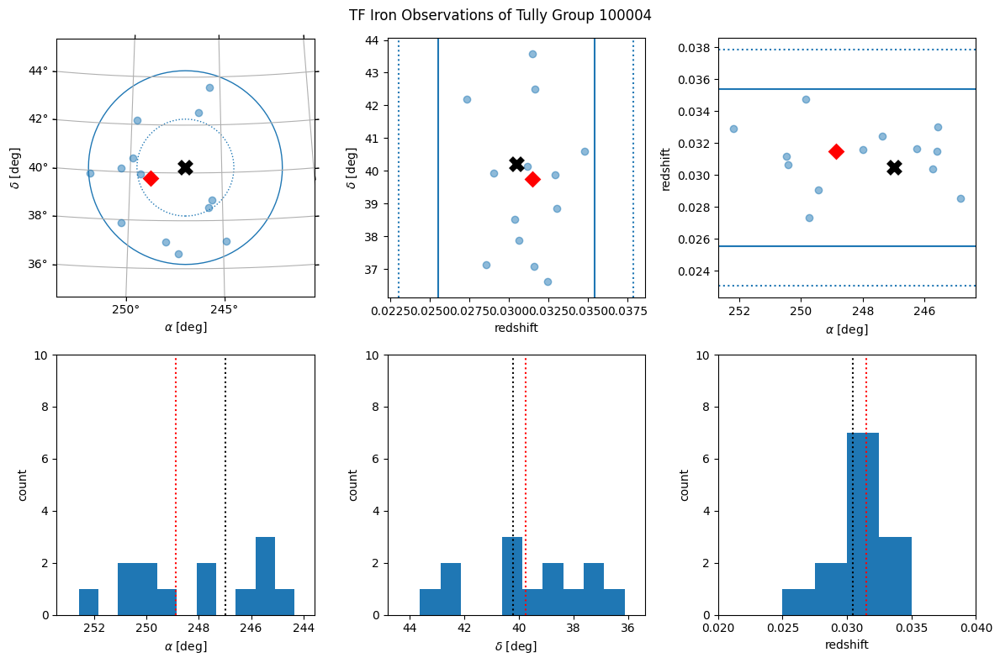

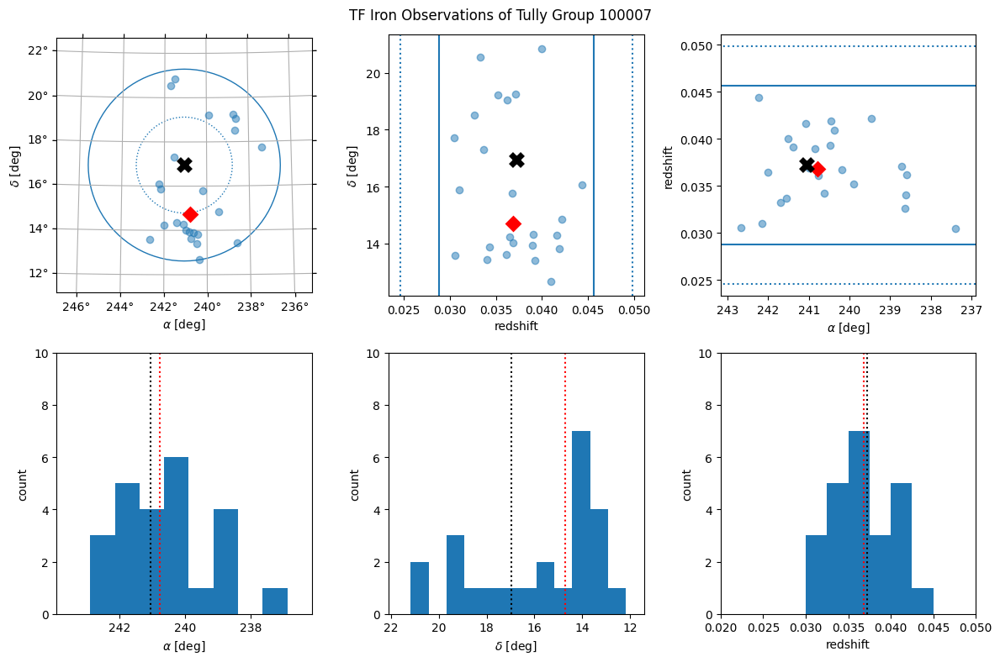

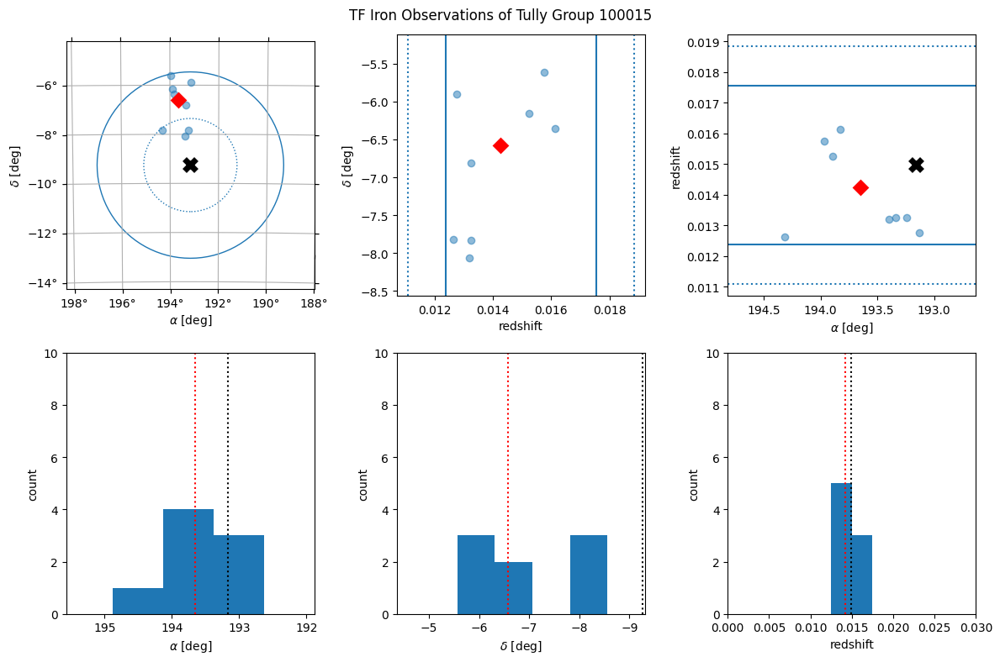

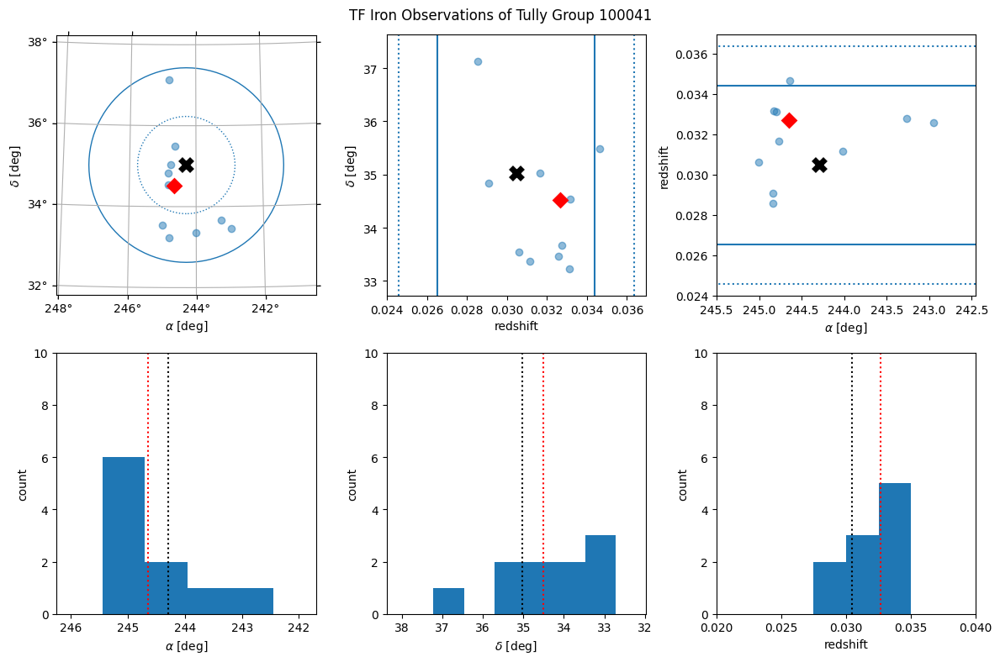

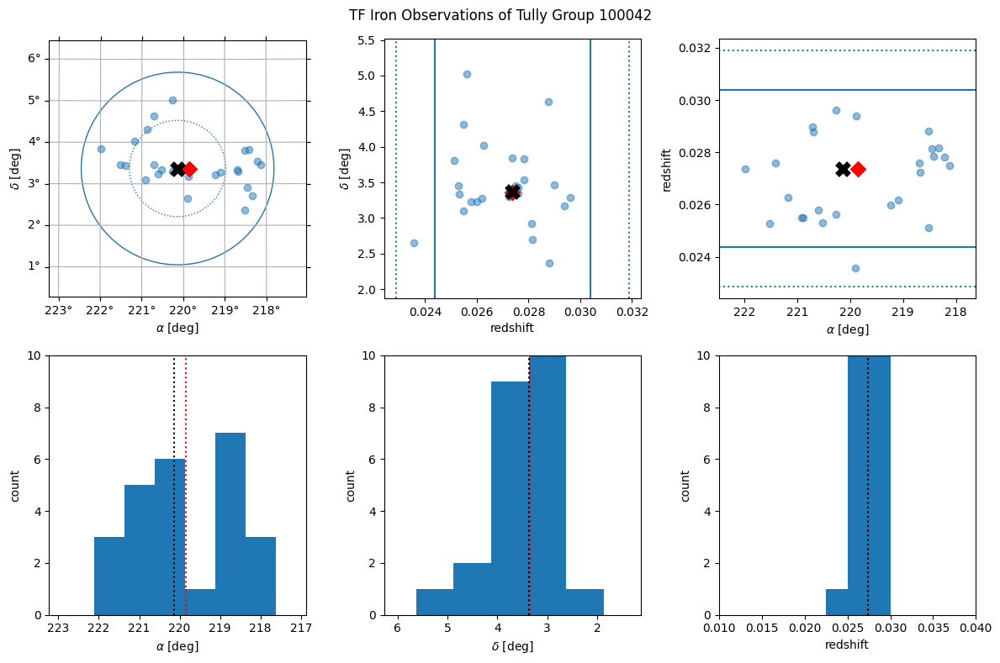

...

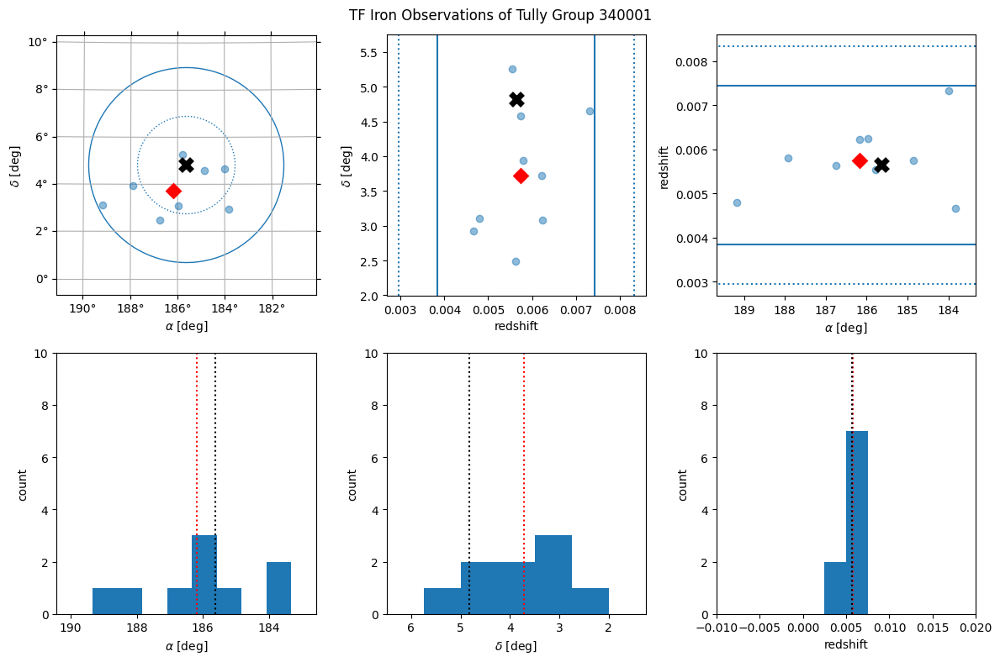

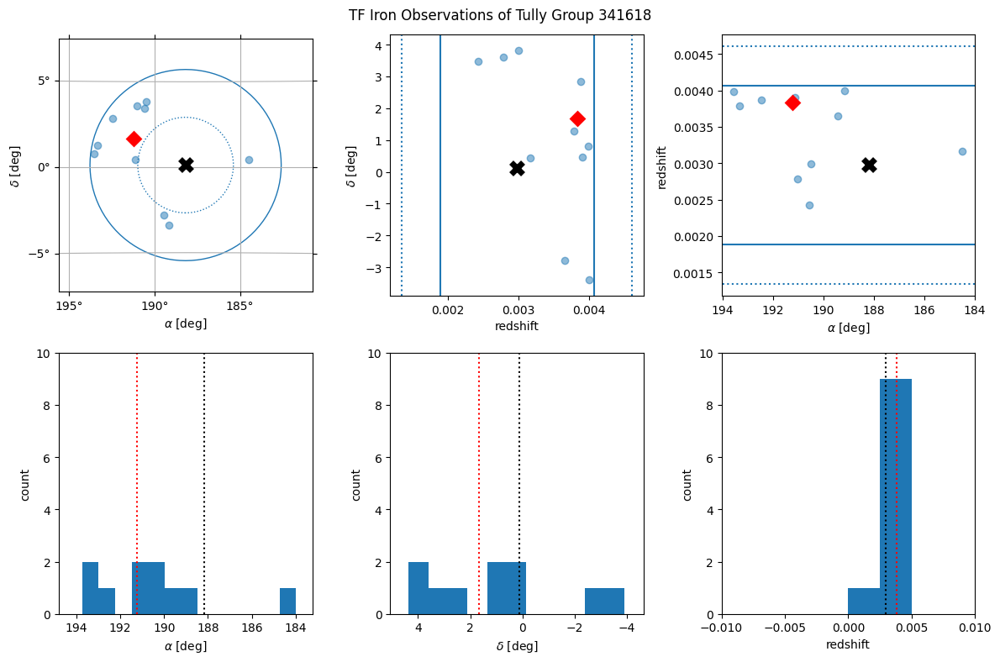

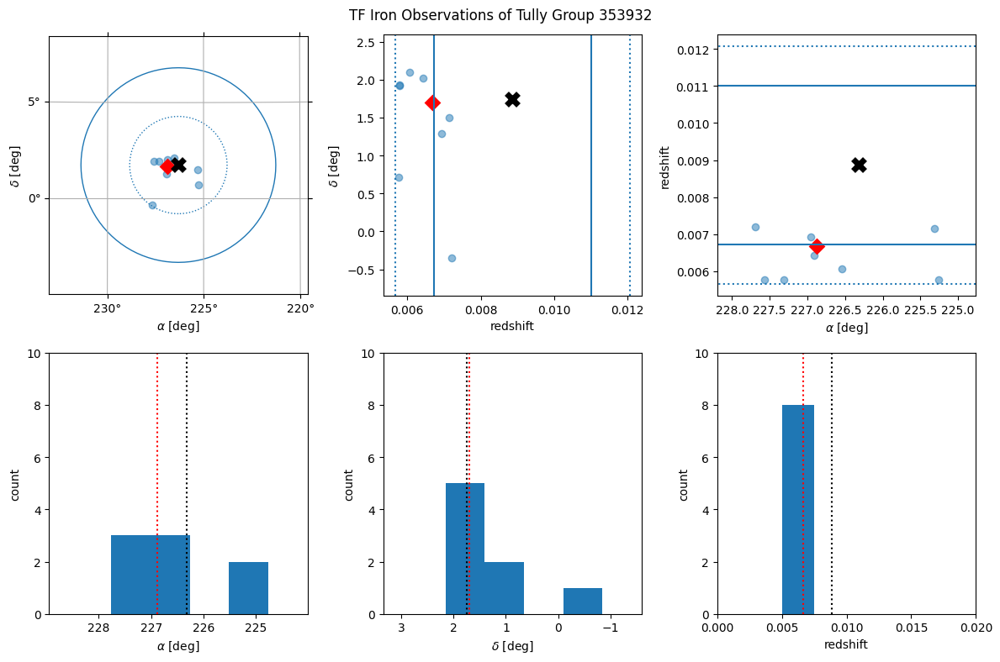

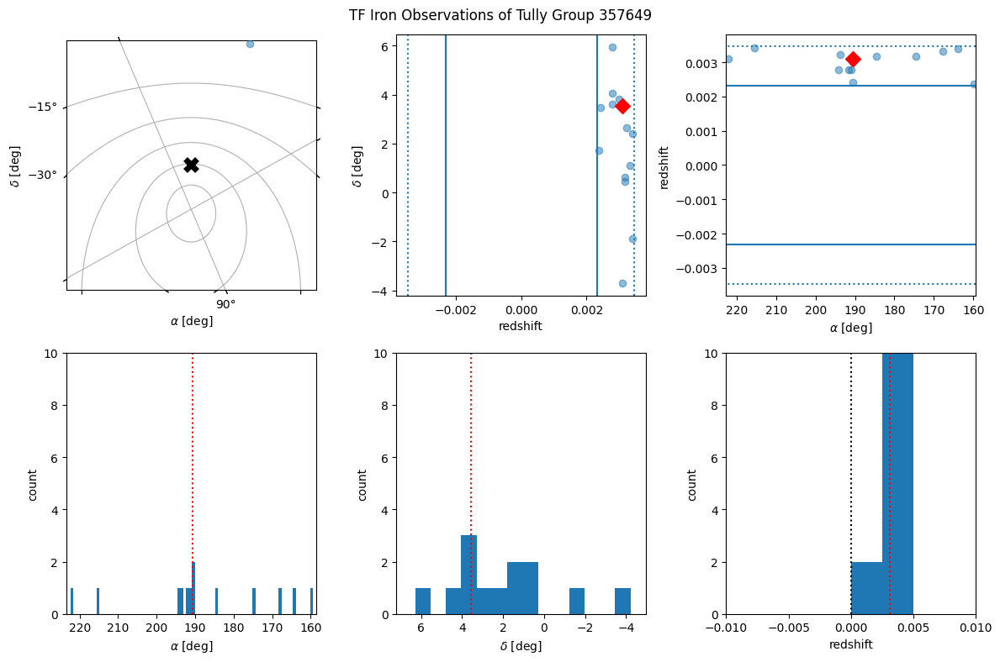

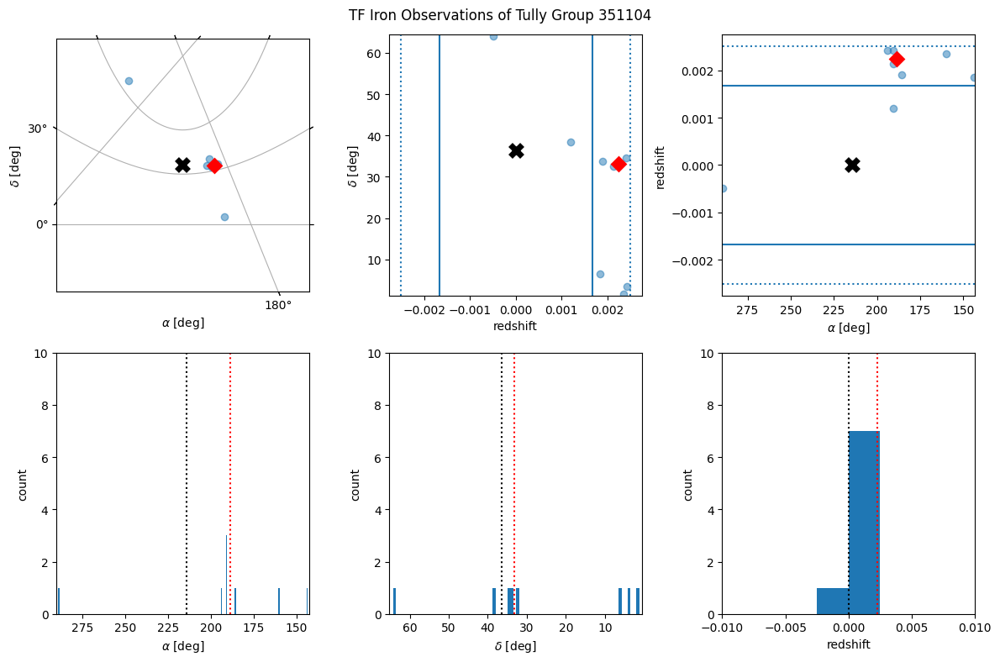

In [19]:
for cluster_id in sga_clusters.keys():
    fig = plot_cluster_members(clusters, cluster_id, sgatab_sel, sga_clusters[cluster_id])

# Apply Cluster Selection

Plot the clusters as a function of $\Delta\theta/\angle(R_{2t})$ versus $\Delta v/\sigma_V$. The quantities are:
* $\Delta\theta$: the angular separation between the median position of the DESI observations and the cluster center reported in Tully 2015.
* $\angle(R_{2t})$: the angular projection of the cluster second turnaround radius.
* $\Delta v = v_\text{cluster} - v_\text{SGA,median}$.
* $\sigma_V$: the velocity dispersion of the cluster, reported in Tully 2015.

A reasonable selection appears to be

1. $\Delta v/ \sigma_V < 1$
2. $\Delta\theta / R_{2t} < 1$

100004       304.859 km/s     740.000 km/s       0.412       1.518 deg       1.350 deg       0.749
100007       116.382 km/s    1261.000 km/s       0.092       2.247 deg       1.448 deg       1.035
100015       215.390 km/s     387.000 km/s       0.557       2.713 deg       1.267 deg       1.428
100041       662.567 km/s     589.000 km/s       1.125       0.590 deg       0.802 deg       0.491
100042         4.991 km/s     451.000 km/s       0.011       0.286 deg       0.774 deg       0.246
100046       214.257 km/s     737.000 km/s       0.291       0.379 deg       0.791 deg       0.320
100051       157.818 km/s     268.000 km/s       0.589       0.360 deg       0.761 deg       0.316
100058       324.290 km/s     326.000 km/s       0.995       0.266 deg       0.750 deg       0.236
100067        74.354 km/s     763.000 km/s       0.097       0.407 deg       0.997 deg       0.272
100071        75.104 km/s     358.000 km/s       0.210       1.711 deg       0.808 deg       1.412
100077    

/tmp/ipykernel_725117/3005893550.py:15: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_angle = np.arctan(cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_725117/3005893550.py:16: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_725117/3005893550.py:17: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
/tmp/ipykernel_725117/3005893550.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian


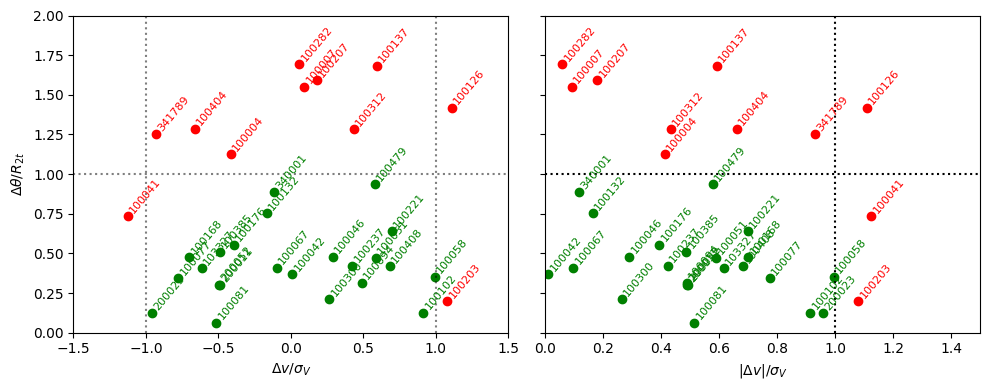

In [20]:
keep_cluster = []
dv_sigmaV = []
dtheta_R2t = []
cluster_ids = []

for cluster_id, sga_ids in sga_clusters.items():
    #- Get cluster sky coordinates
    # idx = np.in1d(clusters['Nest'], cluster_id)
    idx = clusters['Nest'] == cluster_id
    cluster_lon = clusters['SGLON'][idx][0]
    cluster_lat = clusters['SGLAT'][idx][0]
    cluster_v = 100 * 10**(0.2*(clusters['DM'][idx][0] - 25)) / (1 + clusters['HRV'][idx][0]/c_kms)
    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]
    cluster_R2t_angle = np.arctan(cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_1p5 = np.arctan(1.5*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_3 = np.arctan(3*cluster_R2t / (cluster_v/H0)) * u.radian
    cluster_R2t_4 = np.arctan(4*cluster_R2t / (cluster_v/H0)) * u.radian
    
    cluster_coord = SkyCoord(cluster_lon, cluster_lat, unit='deg', frame='supergalactic').transform_to('icrs')
    
    #- Get SGA galaxy coordinates and median of observations
    # idx = np.in1d(sgatab['SGA_ID'], sga_ids)
    idx = np.isin(sgatab['SGA_ID'], sga_ids)
    z_sga = sgatab['Z_DESI'][idx]
    z_sorted = np.sort(z_sga)
    ngal = len(z_sorted)
    z_sga_median = np.mean(z_sorted[ngal//2:ngal//2 + 2]) if (ngal % 2 == 0) else z_sorted[ngal//2]
    
    sga_coords = SkyCoord(ra=sgatab['RA'][idx], dec=sgatab['DEC'][idx], unit='deg', frame='icrs')
    sga_coords_median = cluster_median_coords(sga_coords)

    #- Compute the angle and velocity ratios:
    delta_v = cluster_v - c_kms*z_sga_median
    _dv_sigV = delta_v / cluster_sigma
    dv_sigmaV.append(_dv_sigV)

    delta_theta = sga_coords_median.separation(cluster_coord).to('rad')
    _dth_R2t = delta_theta / cluster_R2t_angle
    dtheta_R2t.append(_dth_R2t)

    cluster_ids.append(cluster_id)

    #- Print results:
    print(f'{cluster_id:<8d}{np.abs(delta_v):12.3f} km/s{cluster_sigma:12.3f} km/s{np.abs(delta_v)/cluster_sigma:12.3f}' \
          f'{delta_theta.to("deg"):12.3f}{cluster_R2t_angle.to("deg"):12.3f}{delta_theta / (1.5*cluster_R2t_angle):12.3f}')

dv_sigmaV = np.asarray(dv_sigmaV)
dtheta_R2t = np.asarray(dtheta_R2t)
cluster_ids = np.asarray(cluster_ids)

#- Apply selection
dvcut = 1
dthcut = 1

select = (np.abs(dv_sigmaV) < dvcut) & (dtheta_R2t < dthcut)

#- Plot results

fig, axes = plt.subplots(1, 2, figsize=(10,4), sharey=True, tight_layout=True)
ax = axes[0]
ax.scatter(dv_sigmaV[select], dtheta_R2t[select], color='g')
for _dv, _dth, _id in zip(dv_sigmaV[select], dtheta_R2t[select], cluster_ids[select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='green')

ax.scatter(dv_sigmaV[~select], dtheta_R2t[~select], color='r')
for _dv, _dth, _id in zip(dv_sigmaV[~select], dtheta_R2t[~select], cluster_ids[~select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='red')

ax.axvline(dvcut, ls=':', color='k', alpha=0.5)
ax.axvline(-dvcut, ls=':', color='k', alpha=0.5)
ax.axhline(dthcut, ls=':', color='k', alpha=0.5)
ax.set(xlabel=r'$\Delta v/\sigma_V$',
       xlim=(-1.5, 1.5),
       ylabel=r'$\Delta\theta/R_{2t}$',
       ylim=(0,2))

ax = axes[1]
ax.scatter(np.abs(dv_sigmaV[select]), dtheta_R2t[select], color='g')
for _dv, _dth, _id in zip(np.abs(dv_sigmaV[select]), dtheta_R2t[select], cluster_ids[select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='green')

ax.scatter(np.abs(dv_sigmaV[~select]), dtheta_R2t[~select], color='r')
for _dv, _dth, _id in zip(np.abs(dv_sigmaV[~select]), dtheta_R2t[~select], cluster_ids[~select]):
    ax.annotate(f'{_id}', (_dv, _dth+0.02), fontsize=8, rotation=50, color='red')

ax.axvline(dvcut, ls=':', color='k')
ax.axvline(-dvcut, ls=':', color='k')
ax.axhline(dthcut, ls=':', color='k')
ax.set(xlabel=r'$|\Delta v|/\sigma_V$',
       xlim=(0, 1.5));

# fig.savefig('../../Figures/Y1/TF_Y1_SGA_Vrot_clusters_selection_binaryMLupdated_20241023.png', dpi=150);

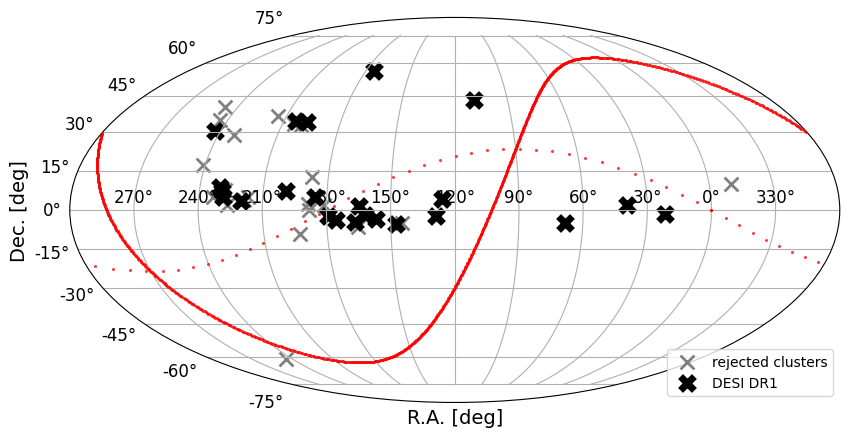

In [21]:
nest_ids = np.asarray(list(sga_clusters.keys()))
good_idx = np.isin(clusters['Nest'], nest_ids[select])
bad_idx = np.isin(clusters['Nest'], nest_ids[~select])
good_cluster_coords = SkyCoord(clusters['SGLON'][good_idx], clusters['SGLAT'][good_idx], unit='deg', frame='supergalactic')
bad_cluster_coords = SkyCoord(clusters['SGLON'][bad_idx], clusters['SGLAT'][bad_idx], unit='deg', frame='supergalactic')

ax = init_sky()

ax.scatter(ax.projection_ra(bad_cluster_coords.transform_to('icrs').ra.value), 
           ax.projection_dec(bad_cluster_coords.transform_to('icrs').dec.value), 
           marker='x', 
           s=100,
           linewidth=2,
           color='gray', 
           label='rejected clusters')
ax.scatter(ax.projection_ra(good_cluster_coords.transform_to('icrs').ra.value), 
           ax.projection_dec(good_cluster_coords.transform_to('icrs').dec.value), 
           marker='x', 
           s=100,
           linewidth=5,
           color='black', 
           label='DESI DR1')

ax.xaxis.label.set_size(14)
ax.yaxis.label.set_size(14)

plt.legend(loc='lower right')

plt.tick_params(axis='both', which='major', labelsize=12);

# plt.savefig('../../Figures/Y1/iron_clusters_Anthony2_dVsys_sky.png', 
#             dpi=150, 
#             facecolor='none');

In [22]:
for i, (cluster_id, sga_ids) in enumerate(sga_clusters.items()):
    print(f'{i+1:2d} {cluster_id:7d} {len(sga_ids):3d} galaxies  {"Y" if select[i] else "N"}')

 1  100004  13 galaxies  N
 2  100007  24 galaxies  N
 3  100015   8 galaxies  N
 4  100041  10 galaxies  N
 5  100042  25 galaxies  Y
 6  100046  18 galaxies  Y
 7  100051  13 galaxies  Y
 8  100058  24 galaxies  Y
 9  100067  44 galaxies  Y
10  100071  12 galaxies  N
11  100077  26 galaxies  Y
12  100081  22 galaxies  Y
13  100094  20 galaxies  Y
14  100102  18 galaxies  Y
15  100126   9 galaxies  N
16  100132  13 galaxies  Y
17  100135   8 galaxies  N
18  100137  13 galaxies  N
19  100168  16 galaxies  Y
20  100176   9 galaxies  Y
21  100191  11 galaxies  N
22  100203   9 galaxies  N
23  100207  11 galaxies  N
24  100221  54 galaxies  Y
25  100237  14 galaxies  Y
26  100282  42 galaxies  N
27  100300  13 galaxies  Y
28  100312  10 galaxies  N
29  100385  13 galaxies  Y
30  100404   8 galaxies  N
31  100408  19 galaxies  Y
32  100479   8 galaxies  Y
33  103327  11 galaxies  Y
34  200011  11 galaxies  Y
35  200023  20 galaxies  Y
36  200052  10 galaxies  Y
37  200075   8 galaxies  N
3

In [23]:
caltab = None    # Table of selected clusters and SGA galaxies
rejtab = None    # Table of clusters failing the selection

for cluster_id, sga_ids in sga_clusters.items():
    if cluster_id in cluster_ids[select]:
        idx = np.isin(sgatab['SGA_ID'], sga_ids)
        clustertab = sgatab[idx]
        clustertab['CLUSTER_ID'] = cluster_id
        
        caltab = clustertab if caltab is None else vstack([caltab, clustertab])
    else:
        idx = np.isin(sgatab['SGA_ID'], sga_ids)
        clustertab = sgatab[idx]
        clustertab['CLUSTER_ID'] = cluster_id
        
        rejtab = clustertab if rejtab is None else vstack([rejtab, clustertab])

# caltab.write('SGA-2020_iron_Vrot_cluster_calib_z0p1_Anthony2_dVsys.fits', overwrite=True)

# caltab[['CLUSTER_ID', 'SGA_ID', 'R_MAG_SB26_CORR', 'R_MAG_SB26_ERR_CORR', 'V_0p4R26', 'V_0p4R26_ERR', 'Z_DESI_CMB','MU_TF', 'MU_ERR', 'LOGDIST','LOGDIST_ERR','MAIN']]
caltab[['CLUSTER_ID', 'SGA_ID', 'R_MAG_SB26_CORR', 'R_MAG_SB26_ERR_CORR', 'V_0p4R26', 'V_0p4R26_ERR', 'Z_DESI_CMB','MU_TF', 'MU_TF_ERR', 'LOGDIST','LOGDIST_ERR','MAIN']]

CLUSTER_ID,SGA_ID,R_MAG_SB26_CORR,R_MAG_SB26_ERR_CORR,V_0p4R26,V_0p4R26_ERR,Z_DESI_CMB,MU_TF,MU_TF_ERR,LOGDIST,LOGDIST_ERR,MAIN
,,,,,,,,,mag,mag,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool
100042,23720.0,14.916536031886935,0.07709449704648867,147.1170578560003,10.39904184378624,0.028947996164932155,35.17333604717004,0.4522038449422982,-0.08683199454893327,0.09044115540509653,False
100042,35725.0,16.43397686334327,0.12601542251505832,67.48317603653496,5.789382640889377,0.02960053312652189,34.406507434628054,0.486035183912977,0.07642192503866028,0.09720736677420382,True
100042,92586.0,15.754397363886238,0.12180746886675094,42.566802555353846,34.14866144040825,0.030371160943289954,32.38066238892692,2.5960277371339155,0.49299719898959043,0.5192058013850144,False
100042,97858.0,16.37760569062084,0.11378924663371037,297.6912116007153,21.600087997052118,0.029735393482026806,38.70025148138614,0.46227348826720316,-0.7803099364813733,0.09245557642750234,False
100042,110020.0,14.991528320219368,0.01568509020450742,85.56103415059025,28.96831085545463,0.026058250210111655,33.65973469449337,1.3058525614585266,0.16929515694394726,0.26117080878272375,True
100042,204265.0,14.843282921388745,0.1252170502030274,127.30163603620909,5.63575917429112,0.029508916318639944,34.67605858392889,0.43354957464319654,0.02113634808328584,0.08671067528493015,True
100042,364828.0,16.380957259321587,0.11399851149938774,98.29741503170287,12.305008420358828,0.028625422855421467,35.45589083779643,0.5538951296632028,-0.1483120343518891,0.11077938257289817,True
100042,465403.0,12.809094225130975,0.11638972256495346,266.1682884641065,9.780901964874454,0.026535159805578967,34.803680008139416,0.42450458034015265,-0.051465366767989455,0.08490192461422272,True


In [24]:
good_clusters, cluster_counts = np.unique(caltab['CLUSTER_ID'], return_counts=True)
len(good_clusters)

23

In [25]:
z_cluster=[]
for i in range(len(good_clusters)):
    z_cluster.append(np.mean(caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == good_clusters[i]]))
    print(f'{i}, {good_clusters[i]}, {z_cluster[i]:.4f}')

0, 100042, 0.0278
1, 100046, 0.0354
2, 100051, 0.0253
3, 100058, 0.0408
4, 100067, 0.0382
5, 100077, 0.0614
6, 100081, 0.0367
7, 100094, 0.0352
8, 100102, 0.0224
9, 100132, 0.0502
10, 100168, 0.0504
11, 100176, 0.0309
12, 100221, 0.0522
13, 100237, 0.0319
14, 100300, 0.0402
15, 100385, 0.0400
16, 100408, 0.0387
17, 100479, 0.0220
18, 103327, 0.0534
19, 200011, 0.0160
20, 200023, 0.0154
21, 200052, 0.0212
22, 340001, 0.0069


# Look at the logdistance distributions in these clusters

We will look at how these distributions vary using our different calibration methods. 
Note: right now, the data has not been zero-pointed so we do not expect the distributions to be centered around zero, but we do expect them to be symmetric.

## Plot the logdistance distributions for each cluster

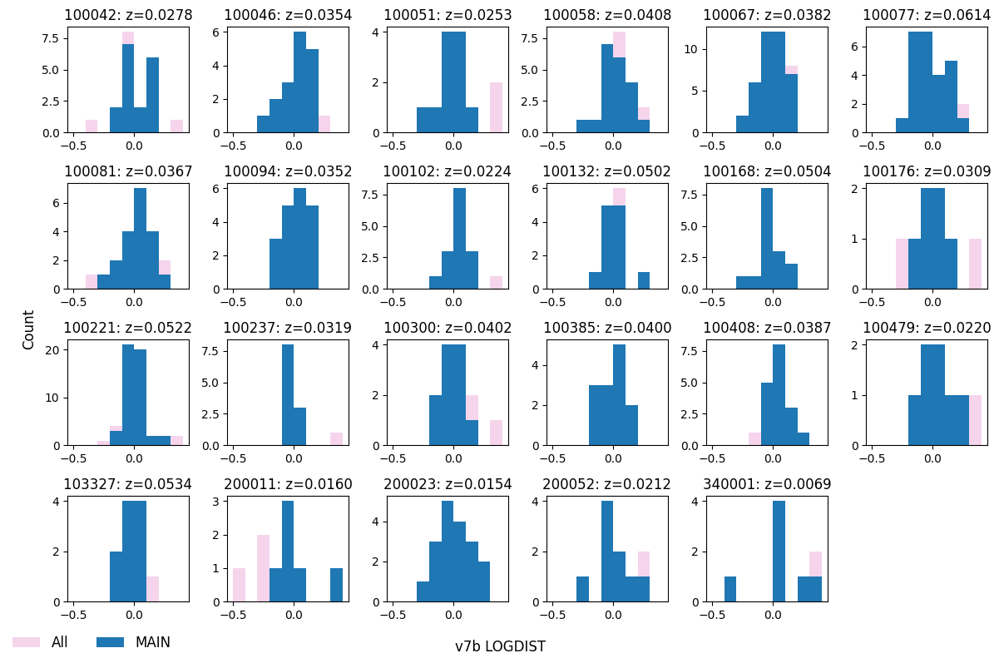

In [26]:
#### make a subset of the objects in our main sample to plot
caltab_main=caltab[caltab['MAIN']]

ncols = 6
nrows = 4

fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,8),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]

    ax.hist(
        caltab['LOGDIST'][caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )

    ax.hist(
        caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=1
        # histtype='step'
    )
    z_cluster = np.mean(caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == good_clusters[i]])
    ax.set_title(f'{good_clusters[i]}: z={z_cluster:.4f}')

    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v7b LOGDIST')

plt.tight_layout()
plt.show()



## Calculate the median skewness from the clusters

In [27]:
# cluster_skew=[]
# cluster_main_skew=[]

# for i in range(len(good_clusters)):
#     cluster_skew.append(skew(caltab['LOGDIST'][caltab['CLUSTER_ID'] == good_clusters[i]]))
#     cluster_main_skew.append(skew(caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == good_clusters[i]]))

# mean_skew = np.mean(cluster_skew)
# std_skew = np.std(cluster_skew)

# mean_main_skew = np.mean(cluster_main_skew)
# std_main_skew = np.std(cluster_main_skew)

# print(f'Full sample: skew = {mean_skew:.3f} +/- {std_skew:.3f}')
# print(f'Main sample: skew = {mean_main_skew:.3f} +/- {std_main_skew:.3f}')

In [28]:
##### Use MCMC to account for the uncertainties in the skew calculation
def skew_mcmc(x, xerr, n_mc=1000):
    skews = np.empty(n_mc)

    for i in range(n_mc):
        x_draw = np.random.normal(x, xerr)
        skews[i] = skew(x_draw, nan_policy='omit')

    return np.mean(skews), np.std(skews)

In [29]:
v5_cluster_skew=[]
v5_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=caltab['LOGDIST'][caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=caltab['LOGDIST_ERR'][caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=caltab_main['LOGDIST_ERR'][caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v5_cluster_skew.append(cluster_mean)
    v5_cluster_main_skew.append(cluster_main_mean)

v5_mean_skew = np.mean(v5_cluster_skew)
v5_std_skew = np.std(v5_cluster_skew)

v5_mean_main_skew = np.mean(v5_cluster_main_skew)
v5_std_main_skew = np.std(v5_cluster_main_skew)

print(f'Full sample: skew = {v5_mean_skew:.3f} +/- {v5_std_skew:.3f}')
print(f'Main sample: skew = {v5_mean_main_skew:.3f} +/- {v5_std_main_skew:.3f}')

Full sample: skew = 0.979 +/- 0.725
Main sample: skew = 0.340 +/- 0.684


In [ ]:
# plt.figure()
# plt.scatter(z_cluster, v5_cluster_skew, c='lightgray', alpha=0.5, label='Full sample')
# plt.scatter(z_cluster, v5_cluster_main_skew, c=cluster_counts, vmin=8, vmax=30, cmap='plasma', label='Main Sample')
# plt.colorbar(label='Number Cluster Members')
# plt.xlabel('Cluster Redshift')
# plt.ylabel('Skewness')
# plt.legend(loc='upper left')
# plt.show()

## Repeat for the alternate versions of our catalog

Full sample: skew = 0.939 +/- 0.712
Main sample: skew = 0.508 +/- 0.643


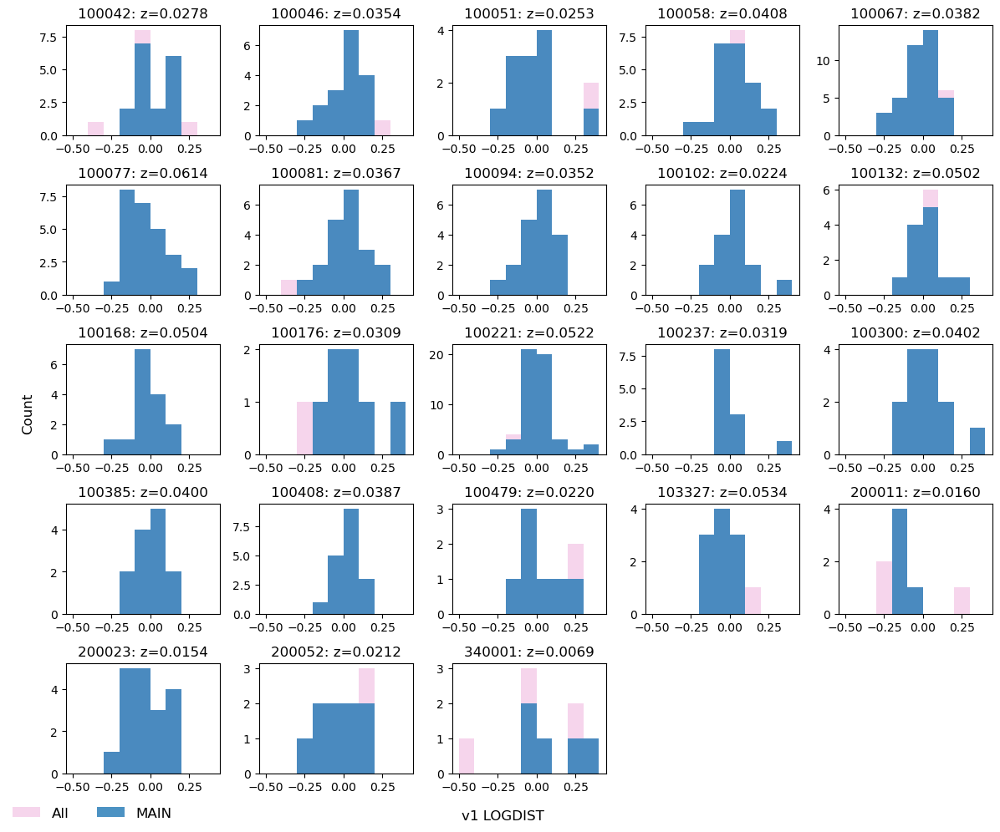

In [91]:
### Read in the new catalog and cross-match to the cluster ids
v1_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v1.fits')
v1_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v1_cat)
v1_caltab_main=v1_caltab[v1_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v1_cluster_skew=[]
v1_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v1_caltab['LOGDIST'][v1_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v1_caltab['LOGDIST_ERR'][v1_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v1_caltab_main['LOGDIST'][v1_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v1_caltab_main['LOGDIST_ERR'][v1_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v1_cluster_skew.append(cluster_mean)
    v1_cluster_main_skew.append(cluster_main_mean)

v1_mean_skew = np.mean(v1_cluster_skew)
v1_std_skew = np.std(v1_cluster_skew)

v1_mean_main_skew = np.mean(v1_cluster_main_skew)
v1_std_main_skew = np.std(v1_cluster_main_skew)

print(f'Full sample: skew = {v1_mean_skew:.3f} +/- {v1_std_skew:.3f}')
print(f'Main sample: skew = {v1_mean_main_skew:.3f} +/- {v1_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v1_caltab['LOGDIST'][v1_caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v1_caltab_main['LOGDIST'][v1_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v1_caltab["Z_DESI_CMB"][v1_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')
    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v1 LOGDIST')

plt.tight_layout()
plt.show()



Full sample: skew = 0.954 +/- 0.713
Main sample: skew = 0.483 +/- 0.670


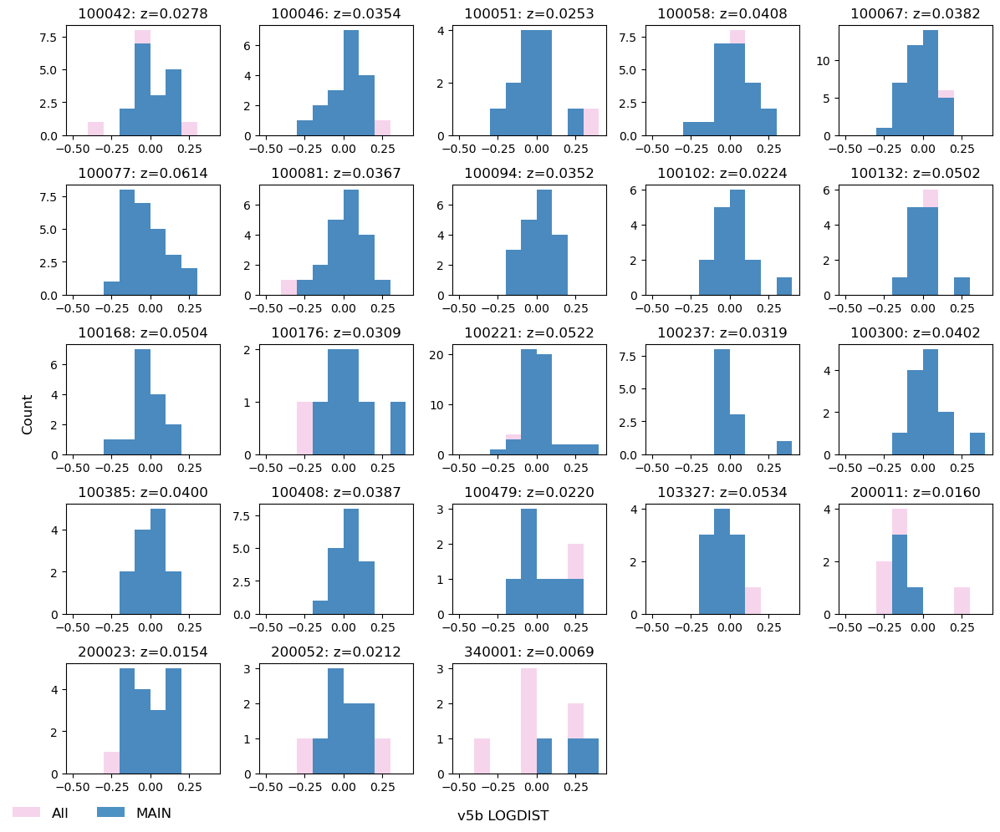

In [95]:
### Read in the new catalog and cross-match to the cluster ids
v5b_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v5b.fits')
v5b_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v5b_cat)
v5b_caltab_main=v5b_caltab[v5b_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v5b_cluster_skew=[]
v5b_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v5b_caltab['LOGDIST'][v5b_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v5b_caltab['LOGDIST_ERR'][v5b_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v5b_caltab_main['LOGDIST'][v5b_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v5b_caltab_main['LOGDIST_ERR'][v5b_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v5b_cluster_skew.append(cluster_mean)
    v5b_cluster_main_skew.append(cluster_main_mean)

v5b_mean_skew = np.mean(v5b_cluster_skew)
v5b_std_skew = np.std(v5b_cluster_skew)

v5b_mean_main_skew = np.mean(v5b_cluster_main_skew)
v5b_std_main_skew = np.std(v5b_cluster_main_skew)

print(f'Full sample: skew = {v5b_mean_skew:.3f} +/- {v5b_std_skew:.3f}')
print(f'Main sample: skew = {v5b_mean_main_skew:.3f} +/- {v5b_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v5b_caltab['LOGDIST'][v5b_caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v5b_caltab_main['LOGDIST'][v5b_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v5b_caltab["Z_DESI_CMB"][v5b_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')# ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v5b LOGDIST')

plt.tight_layout()
plt.show()



Full sample: skew = 0.995 +/- 0.748
Main sample: skew = 0.729 +/- 0.879


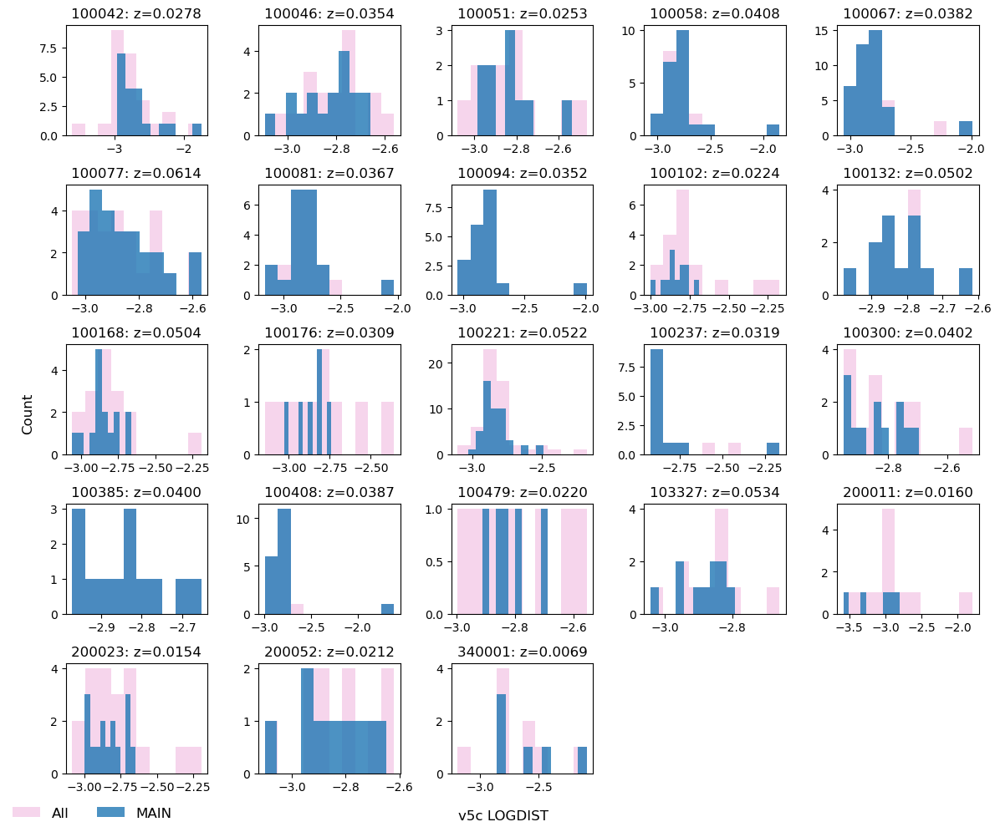

In [94]:
### Read in the new catalog and cross-match to the cluster ids
v5c_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v5-lowcal_extrap.fits')
v5c_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v5c_cat)
v5c_caltab_main=v5c_caltab[v5c_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v5c_cluster_skew=[]
v5c_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v5c_caltab['LOGDIST'][v5c_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v5c_caltab['LOGDIST_ERR'][v5c_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v5c_caltab_main['LOGDIST'][v5c_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v5c_caltab_main['LOGDIST_ERR'][v5c_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v5c_cluster_skew.append(cluster_mean)
    v5c_cluster_main_skew.append(cluster_main_mean)

v5c_mean_skew = np.mean(v5c_cluster_skew)
v5c_std_skew = np.std(v5c_cluster_skew)

v5c_mean_main_skew = np.mean(v5c_cluster_main_skew)
v5c_std_main_skew = np.std(v5c_cluster_main_skew)

print(f'Full sample: skew = {v5c_mean_skew:.3f} +/- {v5c_std_skew:.3f}')
print(f'Main sample: skew = {v5c_mean_main_skew:.3f} +/- {v5c_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v5c_caltab['LOGDIST'][v5c_caltab['CLUSTER_ID'] == good_clusters[i]],
        # bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v5c_caltab_main['LOGDIST'][v5c_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        # bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v5c_caltab["Z_DESI_CMB"][v5c_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')
    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v5c LOGDIST')

plt.tight_layout()
plt.show()



Full sample: skew = 0.980 +/- 0.742
Main sample: skew = 0.310 +/- 0.726


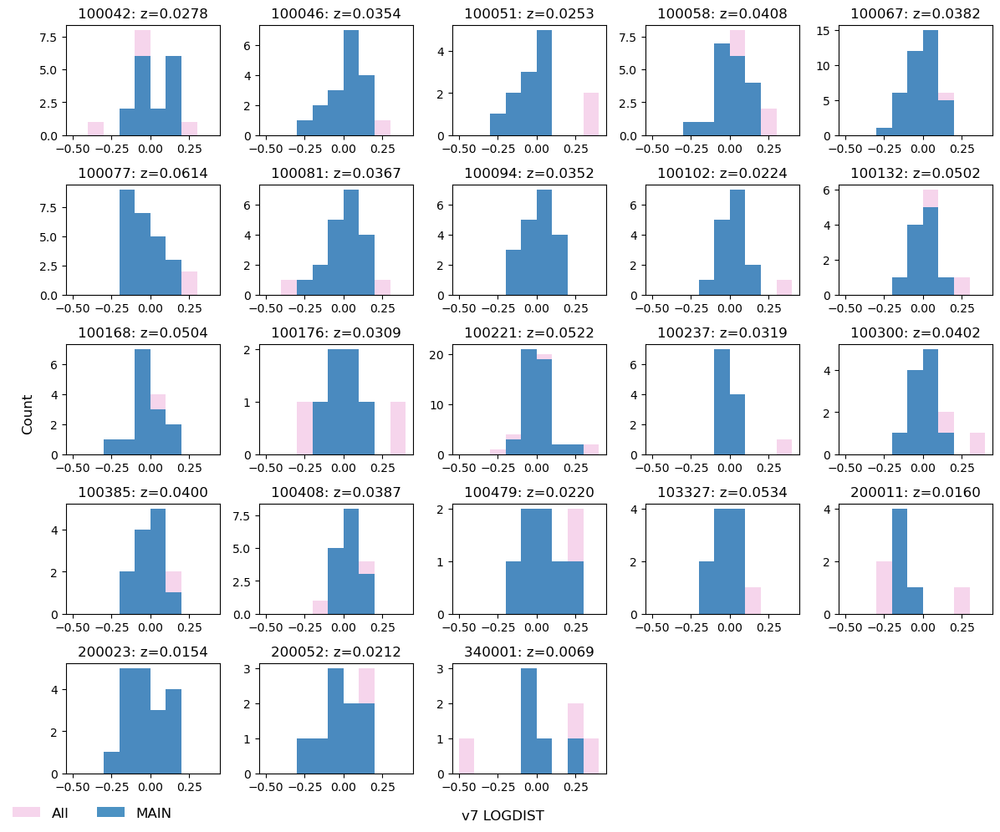

In [96]:
### Read in the new catalog and cross-match to the cluster ids
v7_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v7.fits')
v7_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v7_cat)
v7_caltab_main=v7_caltab[v7_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v7_cluster_skew=[]
v7_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v7_caltab['LOGDIST'][v7_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v7_caltab['LOGDIST_ERR'][v7_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v7_caltab_main['LOGDIST'][v7_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v7_caltab_main['LOGDIST_ERR'][v7_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v7_cluster_skew.append(cluster_mean)
    v7_cluster_main_skew.append(cluster_main_mean)

v7_mean_skew = np.mean(v7_cluster_skew)
v7_std_skew = np.std(v7_cluster_skew)

v7_mean_main_skew = np.mean(v7_cluster_main_skew)
v7_std_main_skew = np.std(v7_cluster_main_skew)

print(f'Full sample: skew = {v7_mean_skew:.3f} +/- {v7_std_skew:.3f}')
print(f'Main sample: skew = {v7_mean_main_skew:.3f} +/- {v7_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v7_caltab['LOGDIST'][v7_caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v7_caltab_main['LOGDIST'][v7_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v7_caltab["Z_DESI_CMB"][v7_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')
    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v7 LOGDIST')

plt.tight_layout()
plt.show()



Full sample: skew = 0.981 +/- 0.731
Main sample: skew = 0.328 +/- 0.740


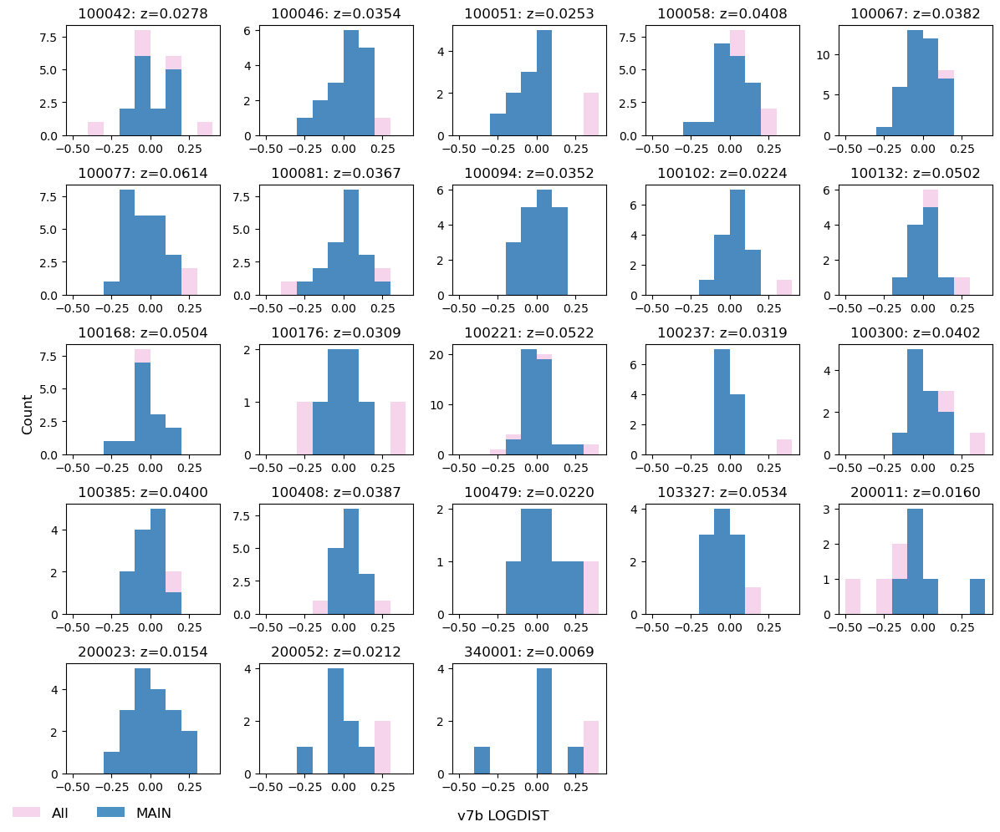

In [97]:
### Read in the new catalog and cross-match to the cluster ids
v7b_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v7-lowcal.fits')
v7b_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v7b_cat)
v7b_caltab_main=v7b_caltab[v7b_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v7b_cluster_skew=[]
v7b_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v7b_caltab['LOGDIST'][v7b_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v7b_caltab['LOGDIST_ERR'][v7b_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v7b_caltab_main['LOGDIST'][v7b_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v7b_caltab_main['LOGDIST_ERR'][v7b_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v7b_cluster_skew.append(cluster_mean)
    v7b_cluster_main_skew.append(cluster_main_mean)

v7b_mean_skew = np.mean(v7b_cluster_skew)
v7b_std_skew = np.std(v7b_cluster_skew)

v7b_mean_main_skew = np.mean(v7b_cluster_main_skew)
v7b_std_main_skew = np.std(v7b_cluster_main_skew)

print(f'Full sample: skew = {v7b_mean_skew:.3f} +/- {v7b_std_skew:.3f}')
print(f'Main sample: skew = {v7b_mean_main_skew:.3f} +/- {v7b_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v7b_caltab['LOGDIST'][v7b_caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v7b_caltab_main['LOGDIST'][v7b_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v7b_caltab["Z_DESI_CMB"][v7b_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')
    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v7b LOGDIST')

plt.tight_layout()
plt.show()



Full sample: skew = 0.982 +/- 0.742
Main sample: skew = 0.314 +/- 0.730


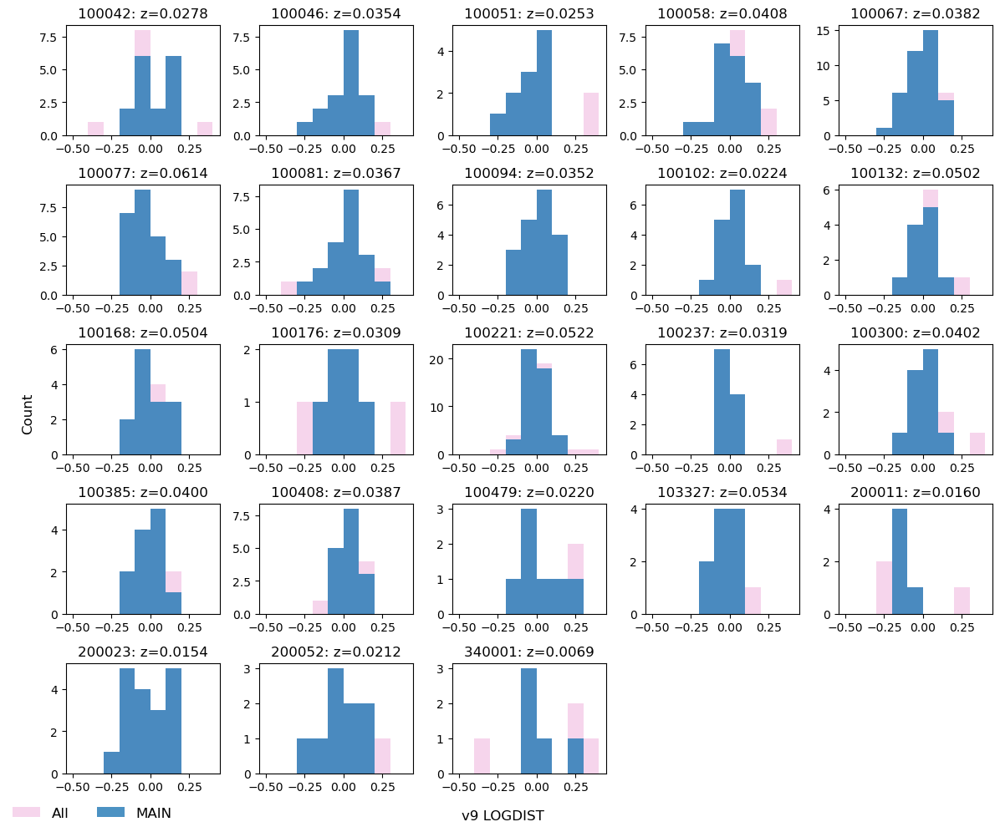

In [98]:
### Read in the new catalog and cross-match to the cluster ids
v9_cat=Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y1/systematic_tests/SGA_iron_jointTFR_v9.fits')
v9_caltab= join(caltab['CLUSTER_ID','SGA_ID'], v9_cat)
v9_caltab_main=v9_caltab[v9_caltab['MAIN']]

####### calculate the skewness of each cluster's fit
v9_cluster_skew=[]
v9_cluster_main_skew=[]


for i in range(len(good_clusters)):
    cluster_mean, cluster_std = skew_mcmc(x=v9_caltab['LOGDIST'][v9_caltab['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v9_caltab['LOGDIST_ERR'][v9_caltab['CLUSTER_ID'] == good_clusters[i]])
    cluster_main_mean, cluster_main_std = skew_mcmc(x=v9_caltab_main['LOGDIST'][v9_caltab_main['CLUSTER_ID'] == good_clusters[i]], 
                                         xerr=v9_caltab_main['LOGDIST_ERR'][v9_caltab_main['CLUSTER_ID'] == good_clusters[i]])

    v9_cluster_skew.append(cluster_mean)
    v9_cluster_main_skew.append(cluster_main_mean)

v9_mean_skew = np.mean(v9_cluster_skew)
v9_std_skew = np.std(v9_cluster_skew)

v9_mean_main_skew = np.mean(v9_cluster_main_skew)
v9_std_main_skew = np.std(v9_cluster_main_skew)

print(f'Full sample: skew = {v9_mean_skew:.3f} +/- {v9_std_skew:.3f}')
print(f'Main sample: skew = {v9_mean_main_skew:.3f} +/- {v9_std_main_skew:.3f}')


##### Plot these distributions
ncols = 5
nrows = 5
fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,10),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    ax.hist(
        v9_caltab['LOGDIST'][v9_caltab['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='All',
        color='tab:pink',
        alpha=0.3
        # histtype='step'
    )
    ax.hist(
        v9_caltab_main['LOGDIST'][v9_caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.1),
        label='MAIN',
        alpha=0.8
        # histtype='step'
    )
    ax.set_title(f'{good_clusters[i]}: z={np.mean(v9_caltab["Z_DESI_CMB"][v9_caltab["CLUSTER_ID"] == good_clusters[i]]):.4f}')
    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=2, fontsize=12)
fig.supylabel('Count')
fig.supxlabel('v9 LOGDIST')

plt.tight_layout()
plt.show()



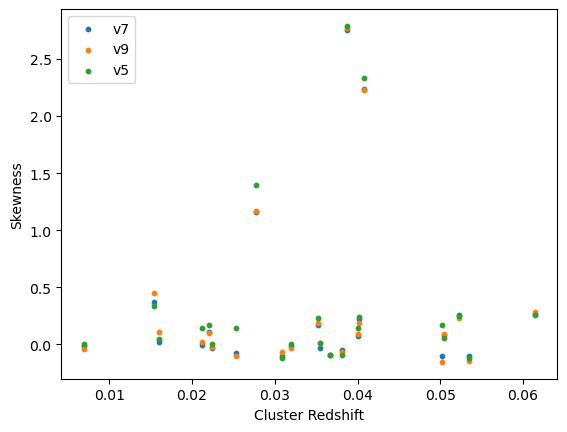

In [113]:
plt.figure()
for version in {'v5', 'v7', 'v9'}:
    
    plt.scatter(z_cluster, globals()[f'{version}_cluster_main_skew'], label=f'{version}', s=10)
    
plt.xlabel('Cluster Redshift')
plt.ylabel('Skewness')
plt.legend(loc='upper left')
plt.show()

# Compare $\eta$ for galaxies in groups vs. others

In [127]:
catalog = Table.read('/global/cfs/cdirs/desi/users/ianw89/groupcatalogs/BGS_Y3/v0.4/GROUP_CATALOG_BGS_Y3_v0.4.fits')
tloa = Table.read('/global/homes/s/sgmoore1/DESI_SGA/TF/Y3/desi_pv_tf_loa_healpix.fits')

### Add SGA_ID to the group catalog

In [128]:
catalog = join(catalog, tloa[['TARGETID','SGA_ID']], keys='TARGETID')

In [129]:
catalog[:5]

TARGETID,RA,DEC,Z,L_GAL,VMAX,P_SAT,M_HALO,N_SAT,L_TOT,IGRP,WEIGHT,APP_MAG_R,Z_ASSIGNED_FLAG,G_R,IS_SAT,QUIESCENT,MSTAR,SGA_ID
,deg,deg,,solLum,Mpc3,,solMass,,solLum,,,,,,,,solMass,
int64,float64,float64,float64,float64,float64,float64,float64,int32,float64,int64,float64,float64,int32,float64,bool,bool,float64,int64
39627357501266324,49.804718,-18.029201,0.049226,6507006000.0,541511000.0,0.0,1753563000000.0,1,10162190000.0,303,0.291517,15.75179672241211,0,0.9272365570068359,False,True,--,1052727
39627357501267329,49.83913,-18.102286,0.048883,3655183000.0,228232900.0,0.999904,1753563000000.0,1,10162190000.0,303,0.315595,16.36215591430664,0,1.0219039916992188,True,True,50954427983.10075,701662
39627357522234044,50.98547,-18.09757,0.066706,13433590000.0,1487421000.0,0.0,2553542000000.0,2,14932850000.0,427,0.262334,15.672845840454102,0,0.8461246490478516,False,True,--,779230
39627357522239568,51.148851,-18.035931,0.077472,27809110000.0,4275519000.0,0.693527,59472980000000.0,15,137383900000.0,99,0.234429,15.228879928588867,0,1.0482597351074219,True,True,--,1123783
39627357568370156,53.827611,-17.889899,0.11485,32298470000.0,4512696000.0,0.0,9559198000000.0,3,37298610000.0,596,0.228876,16.028438568115234,0,0.8178329467773438,False,True,--,435027


### Add group number to the PV catalog

In [130]:
# version='v10'
# sgatab=Table.read(f'/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/DESI-DR1_TF_pv_test_cat_{version}.fits')
sgatab=Table.read('/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/TF_clustering_data_v10.fits')

In [131]:
sgatab = join(sgatab, catalog[['IGRP','SGA_ID']], keys='SGA_ID')

In [123]:
sgatab[:5]

SGA_ID,SGA_GALAXY,GALAXY,PGC,RA_LEDA,DEC_LEDA,MORPHTYPE,PA_LEDA,D25_LEDA,BA_LEDA,Z_LEDA,SB_D25_LEDA,MAG_LEDA,BYHAND,REF,GROUP_ID,GROUP_NAME,GROUP_MULT,GROUP_PRIMARY,GROUP_RA,GROUP_DEC,GROUP_DIAMETER,BRICKNAME,RA,DEC,D26,D26_REF,PA,BA,RA_MOMENT,DEC_MOMENT,SMA_MOMENT,G_SMA50,R_SMA50,Z_SMA50,SMA_SB22,SMA_SB22.5,SMA_SB23,SMA_SB23.5,SMA_SB24,SMA_SB24.5,SMA_SB25,SMA_SB25.5,SMA_SB26,G_MAG_SB22,R_MAG_SB22,Z_MAG_SB22,G_MAG_SB22.5,R_MAG_SB22.5,Z_MAG_SB22.5,G_MAG_SB23,R_MAG_SB23,Z_MAG_SB23,G_MAG_SB23.5,R_MAG_SB23.5,Z_MAG_SB23.5,G_MAG_SB24,R_MAG_SB24,Z_MAG_SB24,G_MAG_SB24.5,R_MAG_SB24.5,Z_MAG_SB24.5,G_MAG_SB25,R_MAG_SB25,Z_MAG_SB25,G_MAG_SB25.5,R_MAG_SB25.5,Z_MAG_SB25.5,G_MAG_SB26,R_MAG_SB26,Z_MAG_SB26,SMA_SB22_ERR,SMA_SB22.5_ERR,SMA_SB23_ERR,SMA_SB23.5_ERR,SMA_SB24_ERR,SMA_SB24.5_ERR,SMA_SB25_ERR,SMA_SB25.5_ERR,SMA_SB26_ERR,G_MAG_SB22_ERR,R_MAG_SB22_ERR,Z_MAG_SB22_ERR,G_MAG_SB22.5_ERR,R_MAG_SB22.5_ERR,Z_MAG_SB22.5_ERR,G_MAG_SB23_ERR,R_MAG_SB23_ERR,Z_MAG_SB23_ERR,G_MAG_SB23.5_ERR,R_MAG_SB23.5_ERR,Z_MAG_SB23.5_ERR,G_MAG_SB24_ERR,R_MAG_SB24_ERR,Z_MAG_SB24_ERR,G_MAG_SB24.5_ERR,R_MAG_SB24.5_ERR,Z_MAG_SB24.5_ERR,G_MAG_SB25_ERR,R_MAG_SB25_ERR,Z_MAG_SB25_ERR,G_MAG_SB25.5_ERR,R_MAG_SB25.5_ERR,Z_MAG_SB25.5_ERR,G_MAG_SB26_ERR,R_MAG_SB26_ERR,Z_MAG_SB26_ERR,G_COG_PARAMS_MTOT,G_COG_PARAMS_M0,G_COG_PARAMS_ALPHA1,G_COG_PARAMS_ALPHA2,G_COG_PARAMS_CHI2,R_COG_PARAMS_MTOT,R_COG_PARAMS_M0,R_COG_PARAMS_ALPHA1,R_COG_PARAMS_ALPHA2,R_COG_PARAMS_CHI2,Z_COG_PARAMS_MTOT,Z_COG_PARAMS_M0,Z_COG_PARAMS_ALPHA1,Z_COG_PARAMS_ALPHA2,Z_COG_PARAMS_CHI2,ELLIPSEBIT,Z_DESI,ZERR_DESI,V_0p4R26,V_0p4R26_ERR,PHOTSYS,D26_kpc,DIST_MAX,MAX_VOL_FRAC,Z_DESI_CMB,MORPHTYPE_AI,JOHN_VI,G_MAG_SB26_CORR,R_MAG_SB26_CORR,Z_MAG_SB26_CORR,G_MAG_SB26_ERR_CORR,R_MAG_SB26_ERR_CORR,Z_MAG_SB26_ERR_CORR,MU_ZCMB,R_ABSMAG_SB26,logV,logV_ERR,Sn,LOGDIST,LOGDIST_ERR,LOGDIST_alpha,OUTLIER,MAIN,MU_ZCMB_ERR,R_ABSMAG_SB26_TF_calc,R_ABSMAG_SB26_TF_ERR_calc,R_ABSMAG_SB26_TF_ERR_STAT_calc,R_ABSMAG_SB26_TF_ERR_SYS_calc,MU_TF_calc,MU_TF_ERR_calc,LOGDIST_calc,LOGDIST_ERR_calc,MU_TF,MU_TF_ERR,IGRP
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,mag,,,,,,,,mag,,,
float64,bytes16,bytes23,int64,float64,float64,bytes4,float32,float32,float32,float32,float32,float32,bool,bytes13,int64,bytes29,int16,bool,float64,float64,float32,bytes8,float64,float64,float32,bytes4,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,float64,float64,float64,float64,bytes1,float64,float64,float64,float64,bytes10,bytes6,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,bool,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64
38.0,SGA-2020 38,SDSSJ140638.88+393138.1,3558705,211.66194,39.5272341,S?,81.63,0.35318315,0.37757218,0.08108376,24.72948,18.361,False,LEDA-20181114,12,SDSSJ140638.88+393138.1,1,True,211.66194,39.5272341,0.35318315,2115p395,211.66203166014844,39.52724032794356,0.41757938,SB26,82.21093,0.41431504,211.6619547015994,39.52729608884245,8.520181,5.252184,4.0750155,3.3951538,3.3006833,4.4037066,5.5453897,6.693271,7.8023033,8.999919,10.213078,11.41192,12.527382,19.246052,18.406073,17.931826,18.841032,18.092857,17.659027,18.5

In [132]:
group, grp_count = np.unique(sgatab['IGRP'], return_counts = True)

count_dict = dict(zip(group, grp_count))

# Add 'field' column: True (or 1) if group size == 1
sgatab['FIELD'] = np.array([count_dict[cid] == 1 for cid in sgatab['IGRP']])
sgatab.remove_column('IGRP')

In [125]:
np.sum(sgatab['FIELD'])/len(sgatab)

0.940490206571765

In [126]:
# sgatab.write(f'/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/DESI-DR1_TF_pv_test_cat_{version}.fits', overwrite=True)

In [136]:
sgatab[:5]

TARGETID,SGA_ID,RA,DEC,Z,ZCMB,WEIGHT,NPV,NDENS,MU,MU_ERR,LOGDIST,LOGDIST_ERR,FIELD
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool
39627830354515481,55,199.73062047638814,1.7262730115560398,0.04400163730894845,0.04508261475414366,0.964532575634106,0.0021019014576094492,0.01930546124350993,35.72998202390718,1.7978621280693206,-0.0007062610926535028,0.8040281738207241,True
39627853494489271,117,138.9354018819327,2.69476220880469,0.09003983347898953,0.09120074612338591,0.9379325755481986,9.280895916360837e-05,0.027464532826117615,37.148609282569424,0.7403158670396539,0.03539066514288635,0.33107905325318276,True
39632966141349468,223,197.78701405654667,34.17125367720305,0.0340259256442166,0.03484683470212291,0.7640233667092191,0.003631072385343918,0.023480178705529885,35.13548715840391,1.8871123116669013,0.0031481496716416232,0.843941966400323,True
39628237889865781,581,118.85976063152584,18.97549532498887,0.043319274261963206,0.044062107713850995,0.5349533131058996,0.0004439397855694832,0.00922840804022263,35.59209124569243,1.229932222042937,0.01661130572722401,0.5500420457162198,True
39627866576519353,669,198.7851341517175,3.218558382411598,0.08359056011127969,0.08471844542226092,0.8726291795935869,0.0007166333538843877,0.03510088713102417,38.131404277078865,0.6919442118279563,-0.1950776377311613,0.30944664632967245,True


In [137]:
# sgatab.write('/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/TF_clustering_data_v10.fits', overwrite=True)

# Compare to FP objects in those groups

In [90]:
alex = Table.read('/global/cfs/cdirs/desi/science/td/pv/tfgalaxies/Y1/systematic_tests/color_xonly_2color_catalog.fits')
FP = Table.read('/global/cfs/cdirs/desi/science/td/pv/fpgalaxies/Y1/v4/FP_pv_cat_v4.csv')

In [91]:
FP = FP[['ra', 'dec', 'z', 'z_err', 'absmag_r', 'logdist', 'logdist_err']]

## See which objects belong to the same clusters as the TF galaxies

In [92]:
fp_coords = SkyCoord(FP['ra'], FP['dec'], unit='deg')
z_fp = FP['z']

FP_cluster = None

for cluster_id in cluster_ids[select]:

    idx = clusters['Nest'] == cluster_id

    cluster_v = (
        100 * 10**(0.2*(clusters['DM'][idx][0] - 25))
        / (1 + clusters['HRV'][idx][0]/c_kms)
    )

    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]

    cluster_coord = SkyCoord(
        clusters['SGLON'][idx][0],
        clusters['SGLAT'][idx][0],
        unit='deg',
        frame='supergalactic'
    )

    sep = cluster_coord.separation(fp_coords)

    R2t_angle_1p5 = np.arctan(
        1.5 * cluster_R2t / (cluster_v / H0)
    ) * u.radian

    R2t_angle_3 = np.arctan(
        3 * cluster_R2t / (cluster_v / H0)
    ) * u.radian

    in_cluster_1 = (
        (sep < R2t_angle_1p5)
        & (z_fp * c_kms > cluster_v - 3 * cluster_sigma)
        & (z_fp * c_kms < cluster_v + 3 * cluster_sigma)
    )

    in_cluster_2 = (
        (sep >= R2t_angle_1p5)
        & (sep < R2t_angle_3)
        & (z_fp * c_kms > cluster_v - 2 * cluster_sigma)
        & (z_fp * c_kms < cluster_v + 2 * cluster_sigma)
    )

    in_cluster = in_cluster_1 | in_cluster_2

    if np.any(in_cluster):

        fp_members = FP[in_cluster].copy()
        fp_members['CLUSTER_ID'] = cluster_id

        if FP_cluster is None:
            FP_cluster = fp_members
        else:
            FP_cluster = vstack([FP_cluster, fp_members])

In [95]:
alex_coords = SkyCoord(alex['RA'], alex['DEC'], unit='deg')
z_alex = alex['Z_DESI']

alex_cluster = None

for cluster_id in cluster_ids[select]:

    idx = clusters['Nest'] == cluster_id

    cluster_v = (
        100 * 10**(0.2*(clusters['DM'][idx][0] - 25))
        / (1 + clusters['HRV'][idx][0]/c_kms)
    )

    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]

    cluster_coord = SkyCoord(
        clusters['SGLON'][idx][0],
        clusters['SGLAT'][idx][0],
        unit='deg',
        frame='supergalactic'
    )

    sep = cluster_coord.separation(alex_coords)

    R2t_angle_1p5 = np.arctan(
        1.5 * cluster_R2t / (cluster_v / H0)
    ) * u.radian

    R2t_angle_3 = np.arctan(
        3 * cluster_R2t / (cluster_v / H0)
    ) * u.radian

    in_cluster_1 = (
        (sep < R2t_angle_1p5)
        & (z_alex * c_kms > cluster_v - 3 * cluster_sigma)
        & (z_alex * c_kms < cluster_v + 3 * cluster_sigma)
    )

    in_cluster_2 = (
        (sep >= R2t_angle_1p5)
        & (sep < R2t_angle_3)
        & (z_alex * c_kms > cluster_v - 2 * cluster_sigma)
        & (z_alex * c_kms < cluster_v + 2 * cluster_sigma)
    )

    in_cluster = in_cluster_1 | in_cluster_2

    if np.any(in_cluster):

        alex_members = alex[in_cluster].copy()
        alex_members['CLUSTER_ID'] = cluster_id

        if alex_cluster is None:
            alex_cluster = alex_members
        else:
            alex_cluster = vstack([alex_cluster, alex_members])

In [96]:
len(FP_cluster), len(alex_cluster)

(2502, 430)

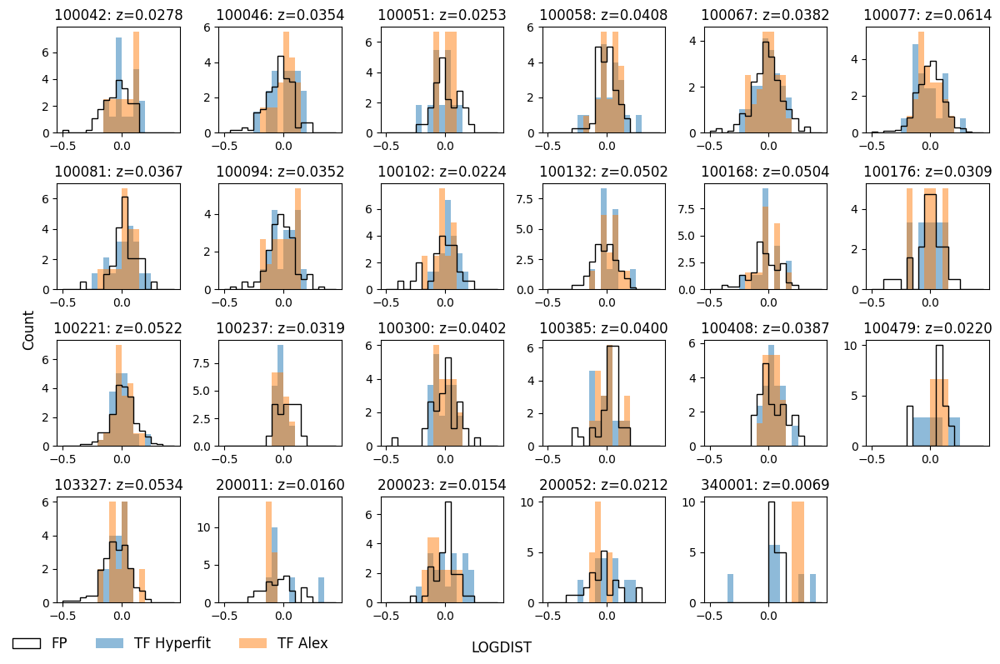

In [107]:
#### make a subset of the objects in our main sample to plot
caltab_main=caltab[caltab['MAIN']]
alex_main=alex_cluster[alex_cluster['MAIN']]

ncols = 6
nrows = 4

fig, axes = plt.subplots(
    nrows, ncols, figsize=(12,8),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]

    # ax.hist(
    #     caltab['LOGDIST'][caltab['CLUSTER_ID'] == good_clusters[i]],
    #     bins=np.arange(-0.5,0.5,0.1),
    #     label='All',
    #     color='tab:pink',
    #     alpha=0.3
    #     # histtype='step'
    # )

    ax.hist(
        FP_cluster['logdist'][FP_cluster['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.05),
        label='FP',
        alpha=1,
        color='k',
        histtype='step', density=True
    )


    ax.hist(
        caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.05),
        label='TF Hyperfit',
        alpha=0.5, density=True
        # histtype='step'
    )

    ax.hist(
        alex_main['LOGDIST'][alex_main['CLUSTER_ID'] == good_clusters[i]],
        bins=np.arange(-0.5,0.5,0.05),
        label='TF Alex',
        alpha=0.5, density=True
        # histtype='step'
    )
    z_cluster = np.mean(caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == good_clusters[i]])
    ax.set_title(f'{good_clusters[i]}: z={z_cluster:.4f}')

    # ax.legend()

# Turn off unused panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', frameon=False, ncols=3, fontsize=12)
fig.supylabel('Normalized Count')
fig.supxlabel('LOGDIST')

plt.tight_layout()
plt.show()



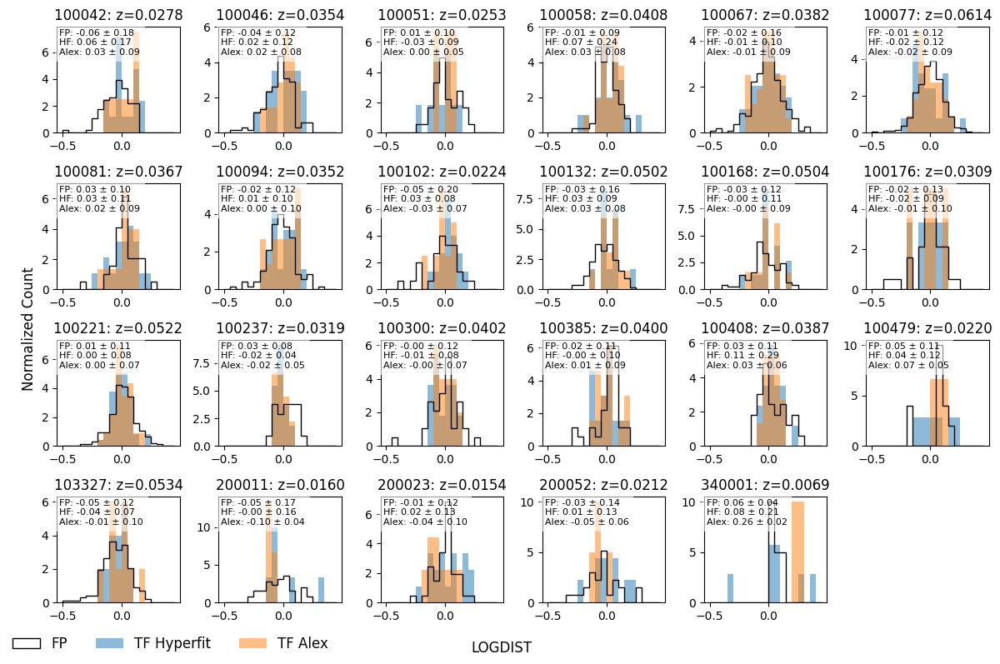

In [113]:
#### make a subset of the objects in our main sample to plot
caltab_main = caltab[caltab['MAIN']]
alex_main = alex_cluster[alex_cluster['MAIN']]

ncols = 6
nrows = 4

fig, axes = plt.subplots(
    nrows, ncols, figsize=(12, 8),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    cluster = good_clusters[i]

    # ---- data subsets ----
    fp_vals = FP_cluster['logdist'][FP_cluster['CLUSTER_ID'] == cluster]
    cal_vals = caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == cluster]
    alex_vals = alex_main['LOGDIST'][alex_main['CLUSTER_ID'] == cluster]

    # ---- stats ----
    fp_mu, fp_sig = np.mean(fp_vals), np.std(fp_vals)
    cal_mu, cal_sig = np.mean(cal_vals), np.std(cal_vals)
    alex_mu, alex_sig = np.mean(alex_vals), np.std(alex_vals)

    # ---- histograms ----
    ax.hist(
        fp_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='FP',
        color='k',
        histtype='step',
        density=True
    )

    ax.hist(
        cal_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='TF Hyperfit',
        alpha=0.5,
        density=True
    )

    ax.hist(
        alex_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='TF Alex',
        alpha=0.5,
        density=True
    )

    # ---- cluster title ----
    z_cluster = np.mean(caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == cluster])
    ax.set_title(f'{cluster}: z={z_cluster:.4f}')

    # ---- per-panel stats annotation ----
    text = (
        f"FP: {fp_mu:.2f} ± {fp_sig:.2f}\n"
        f"HF: {cal_mu:.2f} ± {cal_sig:.2f}\n"
        f"Alex: {alex_mu:.2f} ± {alex_sig:.2f}"
    )

    ax.text(
        0.02, 0.98, text,
        transform=ax.transAxes,
        fontsize=8,
        va='top',
        ha='left',
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

    # ---- optional per-panel legend OFF (kept clean for global legend) ----
    # ax.legend()

# ---- turn off unused panels ----
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# ---- global legend (ONLY dataset names) ----
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower left',
    frameon=False,
    ncols=3,
    fontsize=12
)

fig.supylabel('Normalized Count')
fig.supxlabel('LOGDIST')

plt.tight_layout()
plt.show()

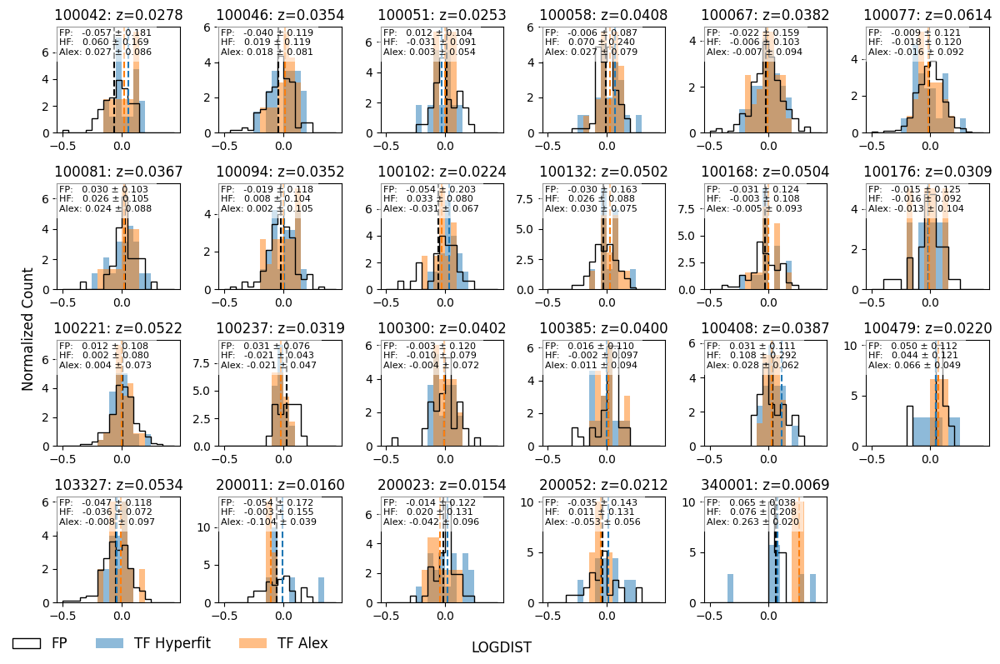

In [114]:
#### make a subset of the objects in our main sample to plot
caltab_main = caltab[caltab['MAIN']]
alex_main = alex_cluster[alex_cluster['MAIN']]

ncols = 6
nrows = 4

fig, axes = plt.subplots(
    nrows, ncols, figsize=(12, 8),
    sharex=False, sharey=False
)

axes = axes.flatten()

for i in range(len(good_clusters)):
    ax = axes[i]
    cluster = good_clusters[i]

    # ---- data subsets ----
    fp_vals = FP_cluster['logdist'][FP_cluster['CLUSTER_ID'] == cluster]
    cal_vals = caltab_main['LOGDIST'][caltab_main['CLUSTER_ID'] == cluster]
    alex_vals = alex_main['LOGDIST'][alex_main['CLUSTER_ID'] == cluster]

    # ---- stats ----
    fp_mu, fp_sig = np.mean(fp_vals), np.std(fp_vals)
    cal_mu, cal_sig = np.mean(cal_vals), np.std(cal_vals)
    alex_mu, alex_sig = np.mean(alex_vals), np.std(alex_vals)

    # ---- histograms ----
    ax.hist(
        fp_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='FP',
        color='k',
        histtype='step',
        density=True
    )

    ax.hist(
        cal_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='TF Hyperfit',
        alpha=0.5,
        density=True
    )

    ax.hist(
        alex_vals,
        bins=np.arange(-0.5, 0.5, 0.05),
        label='TF Alex',
        alpha=0.5,
        density=True
    )

    # ---- mean lines ----
    ax.axvline(fp_mu, color='k', linestyle='--', linewidth=1.5)
    ax.axvline(cal_mu, color='C0', linestyle='--', linewidth=1.5)
    ax.axvline(alex_mu, color='C1', linestyle='--', linewidth=1.5)

    # ---- cluster title ----
    z_cluster = np.mean(
        caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == cluster]
    )
    ax.set_title(f'{cluster}: z={z_cluster:.4f}')

    # ---- per-panel stats annotation ----
    text = (
        f"FP:   {fp_mu:.3f} ± {fp_sig:.3f}\n"
        f"HF:   {cal_mu:.3f} ± {cal_sig:.3f}\n"
        f"Alex: {alex_mu:.3f} ± {alex_sig:.3f}"
    )

    ax.text(
        0.02, 0.98,
        text,
        transform=ax.transAxes,
        fontsize=8,
        va='top',
        ha='left',
        bbox=dict(
            facecolor='white',
            alpha=0.6,
            edgecolor='none'
        )
    )

# ---- turn off unused panels ----
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# ---- global legend (dataset names only) ----
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower left',
    frameon=False,
    ncols=3,
    fontsize=12
)

fig.supylabel('Normalized Count')
fig.supxlabel('LOGDIST')

plt.tight_layout()
plt.show()

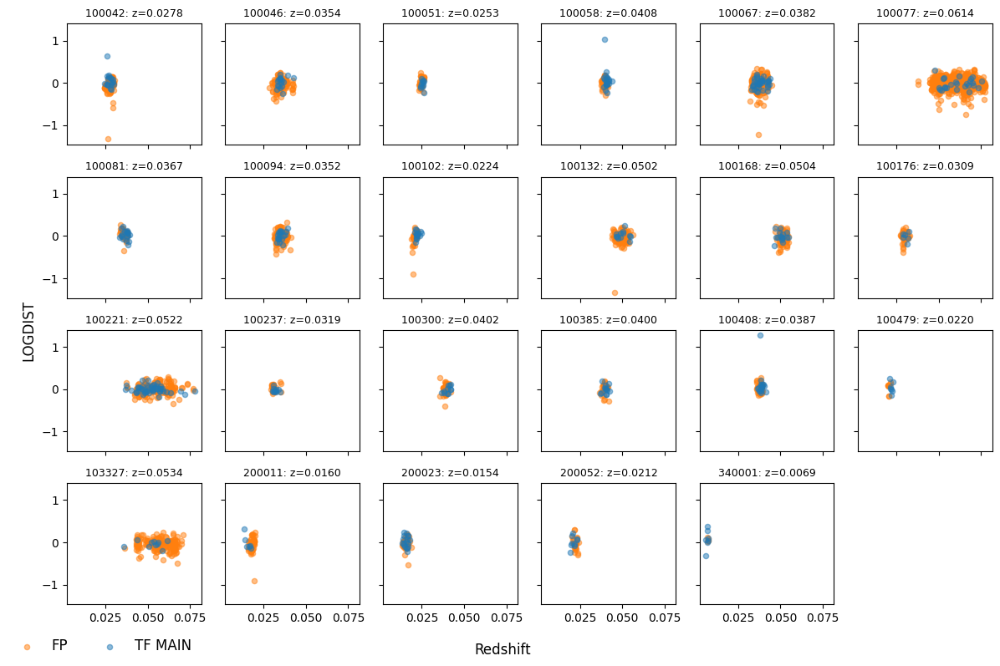

In [69]:
ncols = 6
nrows = 4

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(12, 8),
    sharex=True,
    sharey=True
)

axes = axes.flatten()

for i, cluster_id in enumerate(good_clusters):

    ax = axes[i]

    # FP galaxies
    fp_mask = FP_cluster['CLUSTER_ID'] == cluster_id

    ax.scatter(
        FP_cluster['z'][fp_mask],          # replace with actual FP redshift column if needed
        FP_cluster['logdist'][fp_mask],
        color='tab:orange',
        s=20,
        alpha=0.5,
        label='FP'
    )

    # TF galaxies
    tf_mask = caltab_main['CLUSTER_ID'] == cluster_id

    ax.scatter(
        caltab_main['Z_DESI_CMB'][tf_mask],
        caltab_main['LOGDIST'][tf_mask],
        color='tab:blue',
        s=20,
        alpha=0.5,
        label='TF MAIN'
    )

    z_cluster = np.mean(
        caltab["Z_DESI_CMB"][caltab["CLUSTER_ID"] == cluster_id]
    )

    ax.set_title(f'{cluster_id}: z={z_cluster:.4f}', fontsize=9)

# Turn off unused panels
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower left',
    frameon=False,
    ncols=2,
    fontsize=12
)

fig.supxlabel('Redshift')
fig.supylabel('LOGDIST')

plt.tight_layout()
plt.show()

In [67]:
from matplotlib import gridspec
from matplotlib.colors import Normalize

def plot_cluster_members_TF_FP(
    clusters,
    cluster_id,
    caltab,
    FP_cluster,
    cmap='coolwarm',
    vmin=None,
    vmax=None
):

    idx = clusters['Nest'] == cluster_id

    cluster_lon = clusters['SGLON'][idx][0]
    cluster_lat = clusters['SGLAT'][idx][0]
    cluster_mu = clusters['DM'][idx][0]
    cluster_hrv = clusters['HRV'][idx][0]

    cluster_v = (
        100 * 10**(0.2*(cluster_mu - 25))
        / (1 + cluster_hrv/c_kms)
    )

    cluster_sigma = clusters['sigV'][idx][0]
    cluster_R2t = clusters['R2t'][idx][0]

    cluster_R2t_1p5 = np.arctan(
        1.5 * cluster_R2t / (cluster_v/H0)
    ) * u.radian

    cluster_R2t_3 = np.arctan(
        3 * cluster_R2t / (cluster_v/H0)
    ) * u.radian

    cluster_R2t_4 = np.arctan(
        4 * cluster_R2t / (cluster_v/H0)
    ) * u.radian

    cluster_coord = SkyCoord(
        cluster_lon,
        cluster_lat,
        unit='deg',
        frame='supergalactic'
    ).transform_to('icrs')

    # --------------------------------------------------
    # TF sample
    # --------------------------------------------------

    tf = caltab[caltab['CLUSTER_ID'] == cluster_id]

    tf_coords = SkyCoord(
        tf['RA'],
        tf['DEC'],
        unit='deg'
    )

    tf_z = tf['Z_DESI']
    tf_eta = tf['LOGDIST']

    # --------------------------------------------------
    # FP sample
    # --------------------------------------------------

    fp = FP_cluster[FP_cluster['CLUSTER_ID'] == cluster_id]

    fp_coords = SkyCoord(
        fp['ra'],
        fp['dec'],
        unit='deg'
    )

    fp_z = fp['z']           # modify if needed
    fp_eta = fp['logdist']

    # --------------------------------------------------
    # common color scale
    # --------------------------------------------------

    if vmin is None:
        vmin = min(np.min(tf_eta), np.min(fp_eta))

    if vmax is None:
        vmax = max(np.max(tf_eta), np.max(fp_eta))

    norm = Normalize(vmin=vmin, vmax=vmax)

    # --------------------------------------------------
    # layout
    # --------------------------------------------------

    fig = plt.figure(
        figsize=(14, 4.5),
        constrained_layout=True
    )

    gs = fig.add_gridspec(
        1,
        4,
        width_ratios=[1.3, 1, 1, 0.05]
    )

    ax_sky = fig.add_subplot(
        gs[0, 0],
        projection='astro degrees zoom',
        center=cluster_coord,
        radius=cluster_R2t_4
    )

    ax_decz = fig.add_subplot(gs[0, 1])
    ax_raz = fig.add_subplot(gs[0, 2])
    cax = fig.add_subplot(gs[0, 3])

    # --------------------------------------------------
    # sky plot
    # --------------------------------------------------

    ax_sky.grid()

    sc = ax_sky.scatter(
        tf_coords.ra.deg,
        tf_coords.dec.deg,
        c=tf_eta,
        cmap=cmap,
        norm=norm,
        marker='o',
        s=60,
        edgecolors='k',
        transform=ax_sky.get_transform('world'),
        label='TF'
    )

    ax_sky.scatter(
        fp_coords.ra.deg,
        fp_coords.dec.deg,
        c=fp_eta,
        cmap=cmap,
        norm=norm,
        marker='s',
        s=60,
        transform=ax_sky.get_transform('world'),
        label='FP'
    )

    ax_sky.plot(
        cluster_coord.ra.deg,
        cluster_coord.dec.deg,
        'kx',
        transform=ax_sky.get_transform('world'),
        ms=10,
        mew=2
    )

    ax_sky.add_patch(
        SphericalCircle(
            cluster_coord,
            cluster_R2t_1p5,
            transform=ax_sky.get_transform('world'),
            edgecolor='k',
            linestyle=':',
            facecolor='none'
        )
    )

    ax_sky.add_patch(
        SphericalCircle(
            cluster_coord,
            cluster_R2t_3,
            transform=ax_sky.get_transform('world'),
            edgecolor='k',
            linestyle='-',
            facecolor='none'
        )
    )

    ax_sky.set(
        xlabel='RA [deg]',
        ylabel='Dec [deg]'
    )

    # --------------------------------------------------
    # Dec vs z
    # --------------------------------------------------

    ax_decz.scatter(
        tf_z,
        tf_coords.dec.deg,
        c=tf_eta,
        cmap=cmap,
        norm=norm,
        marker='o',
        s=50,
        edgecolors='k',
    )

    ax_decz.scatter(
        fp_z,
        fp_coords.dec.deg,
        c=fp_eta,
        cmap=cmap,
        norm=norm,
        marker='s',
        s=50
    )

    ax_decz.axvline(
        cluster_v / c_kms,
        color='k',
        lw=1
    )

    ax_decz.set(
        xlabel='z',
        ylabel='Dec [deg]'
    )

    # --------------------------------------------------
    # RA vs z
    # --------------------------------------------------

    ax_raz.scatter(
        tf_coords.ra.deg,
        tf_z,
        c=tf_eta,
        cmap=cmap,
        norm=norm,
        marker='o',
        s=50,
        edgecolors='k',
        label='TF'
    )

    ax_raz.scatter(
        fp_coords.ra.deg,
        fp_z,
        c=fp_eta,
        cmap=cmap,
        norm=norm,
        marker='s',
        s=50,
        label='FP'
    )

    ax_raz.axhline(
        cluster_v / c_kms,
        color='k',
        lw=1
    )

    ax_raz.set(
        xlabel='RA [deg]',
        ylabel='z'
    )

    ax_raz.legend(
        frameon=False,
        loc='best'
    )

    # --------------------------------------------------
    # colorbar
    # --------------------------------------------------

    cbar = fig.colorbar(
        sc,
        cax=cax
    )

    cbar.set_label('LOGDIST')

    fig.suptitle(
        f'Cluster {cluster_id}',
        fontsize=14
    )

    return fig

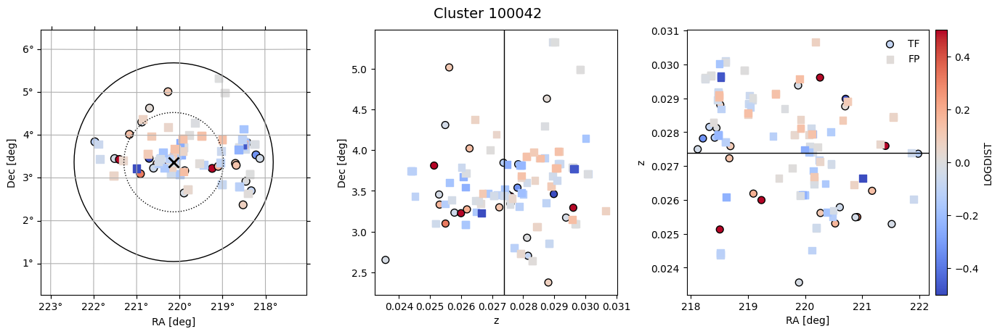

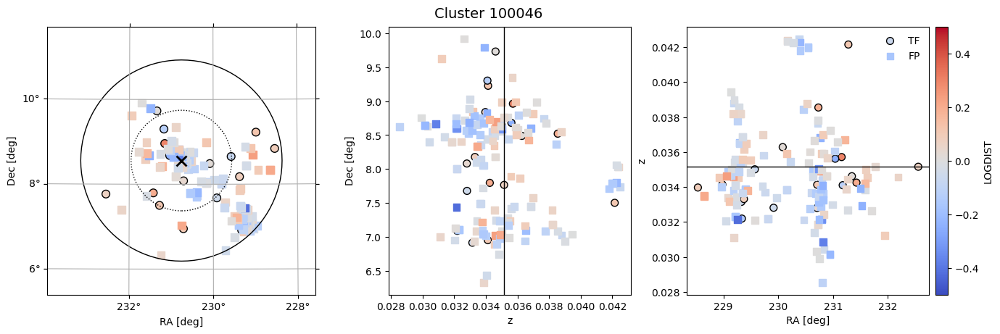

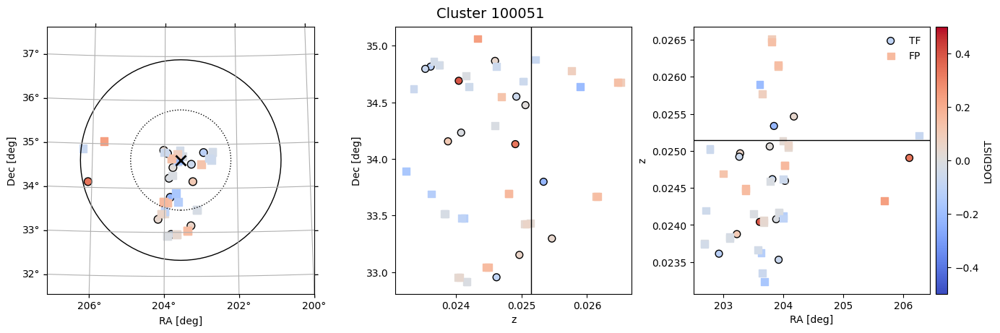

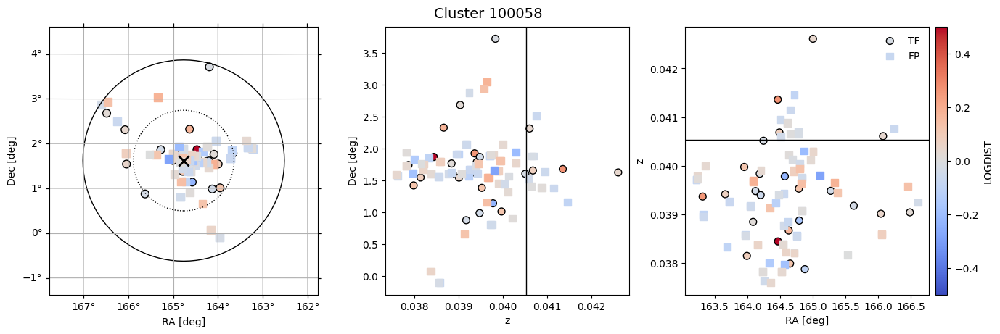

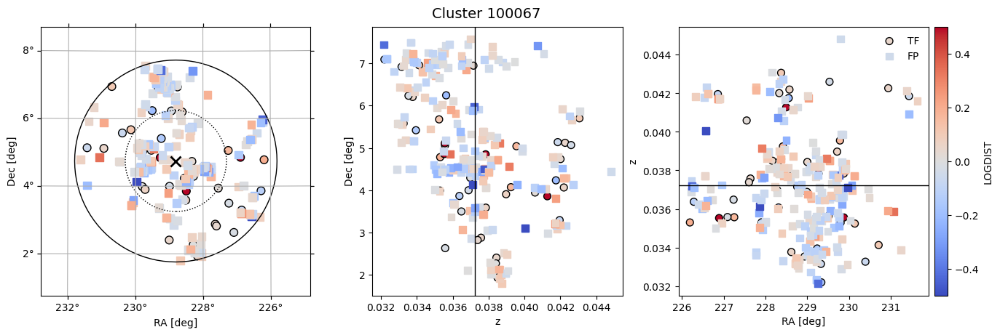

...

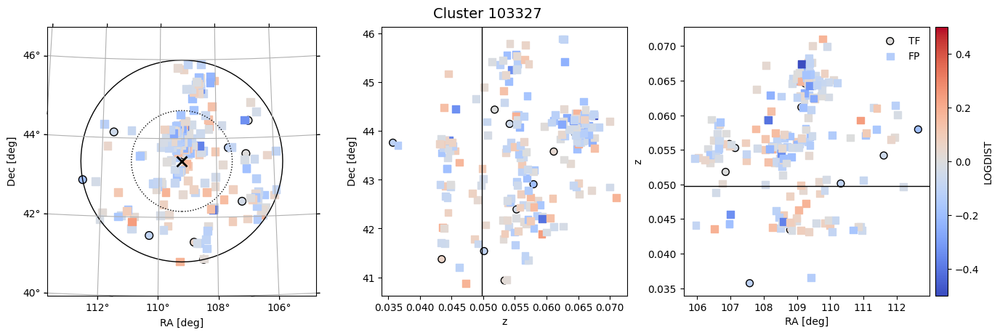

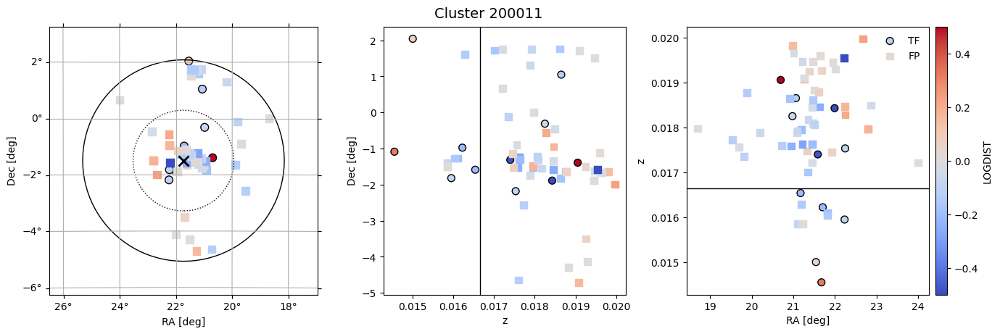

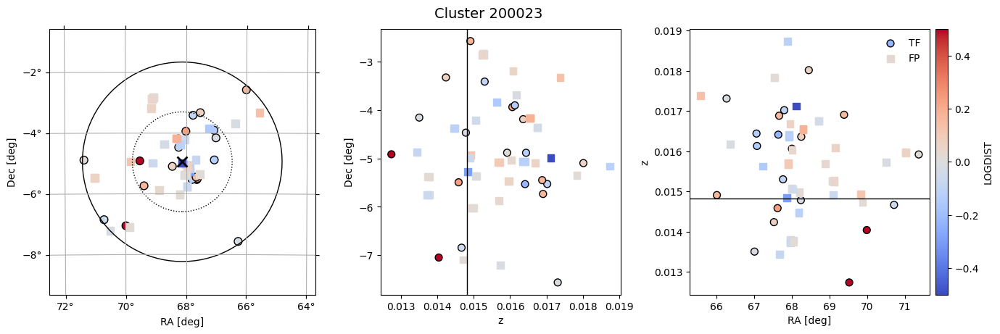

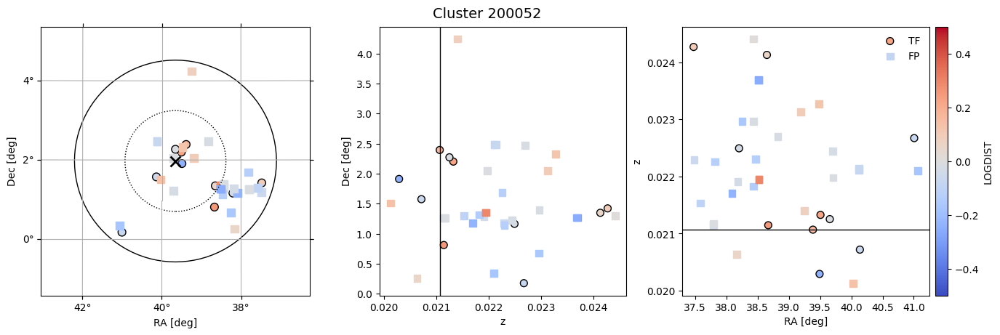

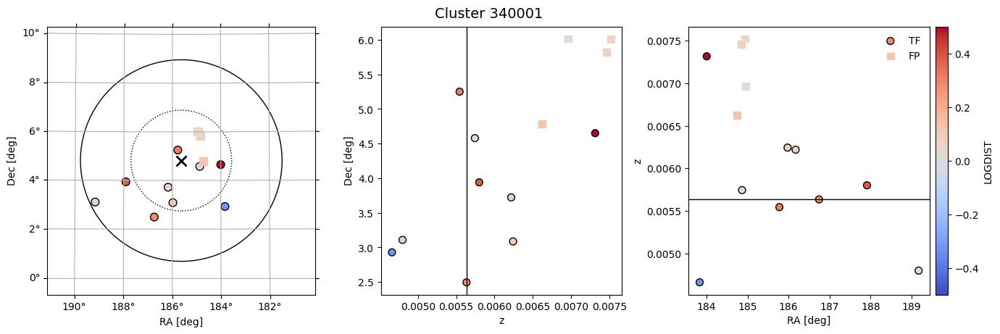

In [68]:
for cluster_id in good_clusters:

    # Skip clusters that have no FP members
    if np.sum(FP_cluster['CLUSTER_ID'] == cluster_id) == 0:
        continue

    fig = plot_cluster_members_TF_FP(
        clusters,
        cluster_id,
        caltab,
        FP_cluster, 
        vmin=-0.5,
        vmax=0.5
    )

    plt.show()

In [84]:
import numpy as np

def radec_z_to_xyz(ra, dec, z, cosmo):

    # comoving distance in Mpc
    D = cosmo.comoving_distance(z).value

    ra = np.deg2rad(ra)
    dec = np.deg2rad(dec)

    x = D * np.cos(dec) * np.cos(ra)
    y = D * np.cos(dec) * np.sin(ra)
    z3 = D * np.sin(dec)

    return x, y, z3

    
def plot_cluster_3d_physical_cosmo(clusters, cluster_id,
                                  caltab, FP_cluster,
                                  cosmo=Planck18_h,
                                  cmap='coolwarm',
                                  vmin=None, vmax=None):

    idx = clusters['Nest'] == cluster_id

    cluster_coord = SkyCoord(
        clusters['SGLON'][idx][0],
        clusters['SGLAT'][idx][0],
        unit='deg',
        frame='supergalactic'
    ).transform_to('icrs')

    # --------------------------------------------------
    # TF sample
    # --------------------------------------------------
    tf = caltab[caltab['CLUSTER_ID'] == cluster_id]

    tf_ra = tf['RA'].values if hasattr(tf['RA'], 'values') else tf['RA']
    tf_dec = tf['DEC'].values if hasattr(tf['DEC'], 'values') else tf['DEC']
    tf_z = tf['Z_DESI_CMB']

    # --------------------------------------------------
    # FP sample
    # --------------------------------------------------
    fp = FP_cluster[FP_cluster['CLUSTER_ID'] == cluster_id]

    fp_ra = fp['ra']
    fp_dec = fp['dec']
    fp_z = fp['z']   # make sure this is CMB frame if possible

    # --------------------------------------------------
    # convert to 3D physical space
    # --------------------------------------------------
    tf_x, tf_y, tf_z3 = radec_z_to_xyz(tf_ra, tf_dec, tf_z, cosmo)
    fp_x, fp_y, fp_z3 = radec_z_to_xyz(fp_ra, fp_dec, fp_z, cosmo)

    # cluster center
    cluster_z = clusters['HRV'][idx][0] / c_kms  # approximate observed z
    c_x, c_y, c_z = radec_z_to_xyz(
        cluster_coord.ra.deg,
        cluster_coord.dec.deg,
        cluster_z,
        cosmo
    )

    # --------------------------------------------------
    # color = η (distance indicator ONLY)
    # --------------------------------------------------
    tf_eta = tf['LOGDIST']
    fp_eta = fp['logdist']

    if vmin is None:
        vmin = min(tf_eta.min(), fp_eta.min())
    if vmax is None:
        vmax = max(tf_eta.max(), fp_eta.max())

    # --------------------------------------------------
    # plot
    # --------------------------------------------------
    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection='3d')

    sc1 = ax.scatter(
        tf_x, tf_y, tf_z3,
        c=tf_eta,
        cmap=cmap,
        vmin=vmin, vmax=vmax,
        marker='o',
        s=45,
        edgecolors='k',
        linewidths=0.4,
        alpha=0.8,
        label='TF'
    )

    sc2 = ax.scatter(
        fp_x, fp_y, fp_z3,
        c=fp_eta,
        cmap=cmap,
        vmin=vmin, vmax=vmax,
        marker='s',
        s=45,
        edgecolors='k',
        linewidths=0.4,
        alpha=0.8,
        label='FP'
    )

    ax.scatter(
        c_x, c_y, c_z,
        c='k',
        marker='x',
        s=120,
        label='Cluster center'
    )

    ax.set_xlabel('X [Mpc]')
    ax.set_ylabel('Y [Mpc]')
    ax.set_zlabel('Z [Mpc]')

    ax.set_title(f'Cluster {cluster_id}')

    ax.legend()

    cbar = fig.colorbar(sc1, ax=ax, shrink=0.7, pad=0.1)
    cbar.set_label('LOGDIST (η)')

    return fig

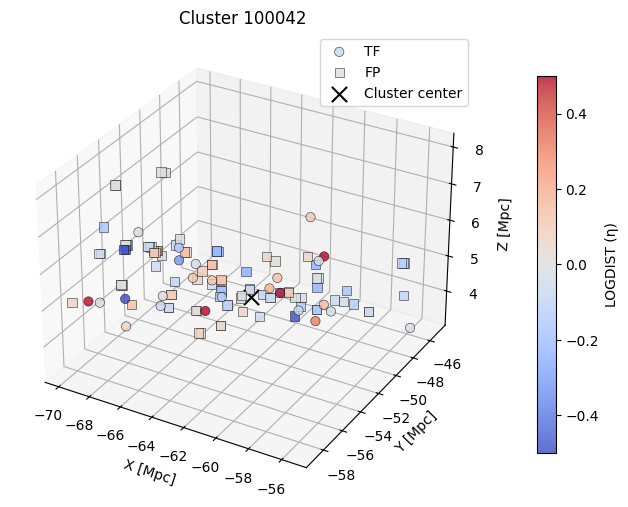

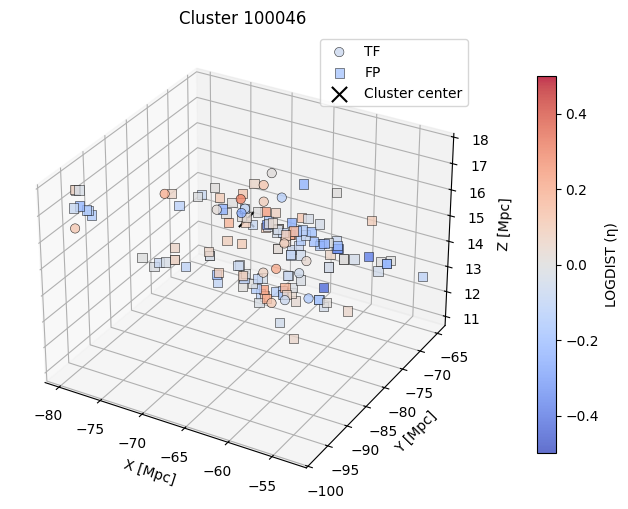

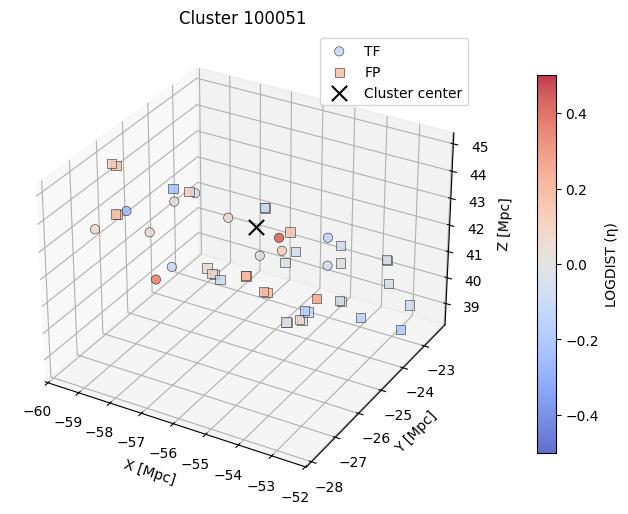

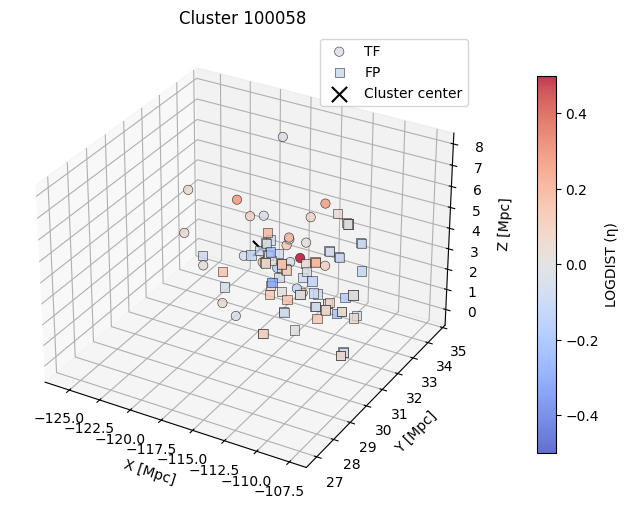

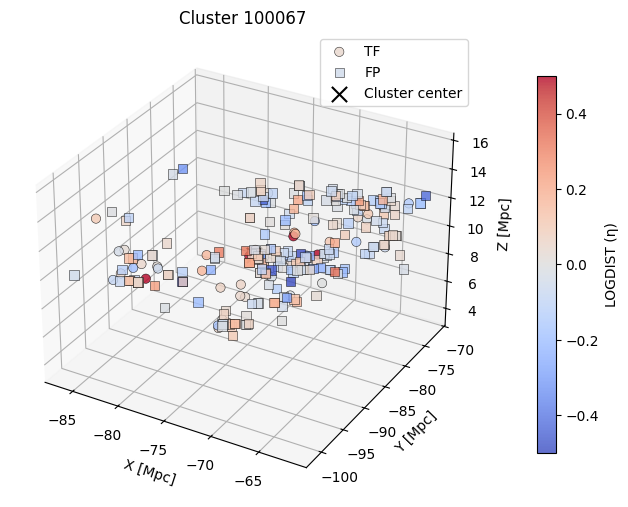

...

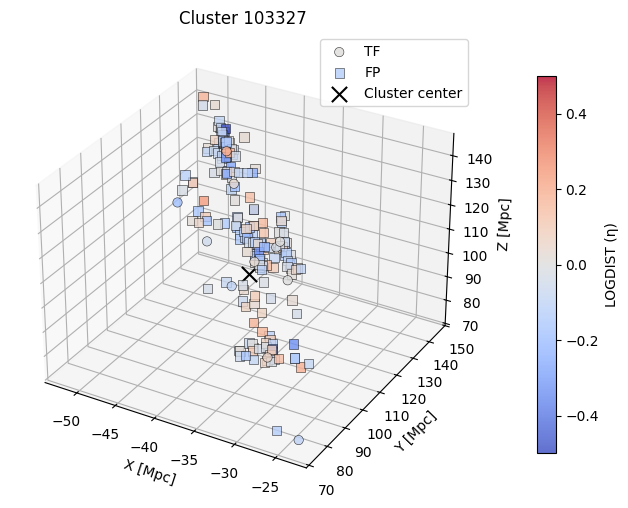

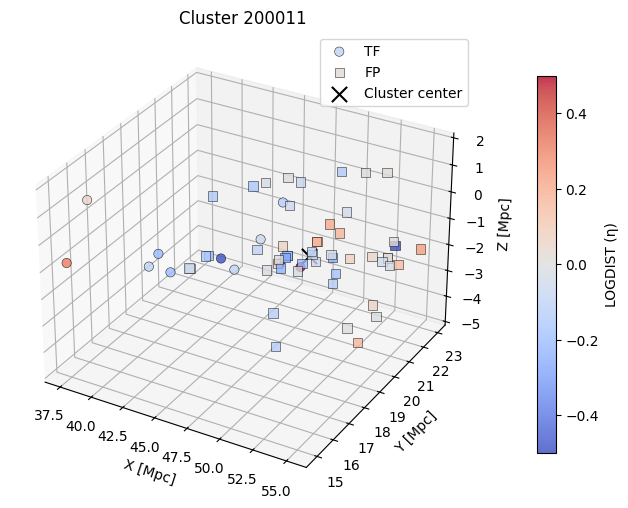

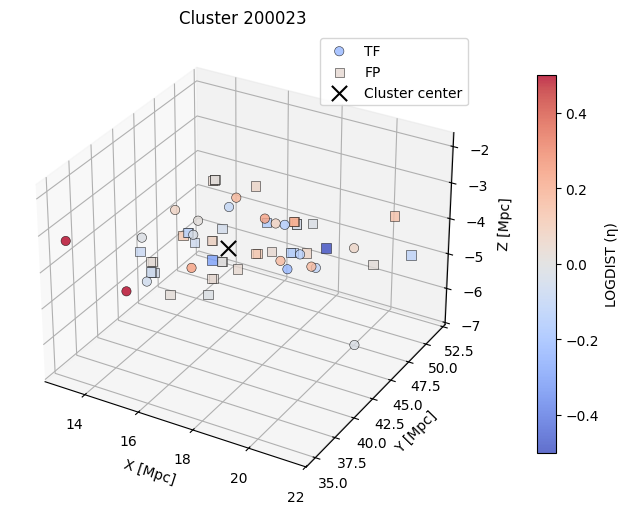

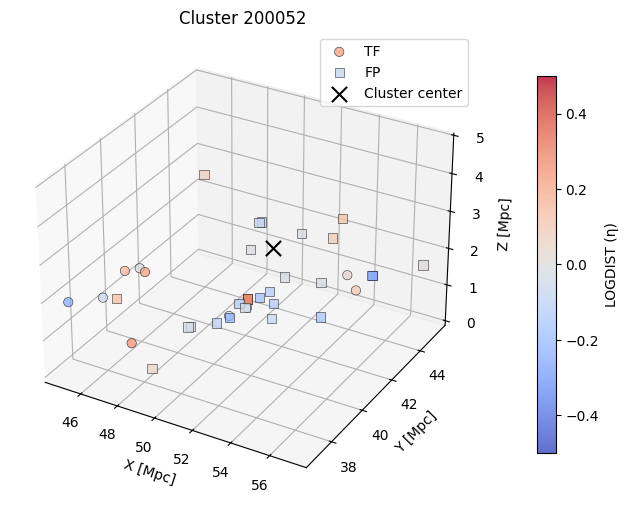

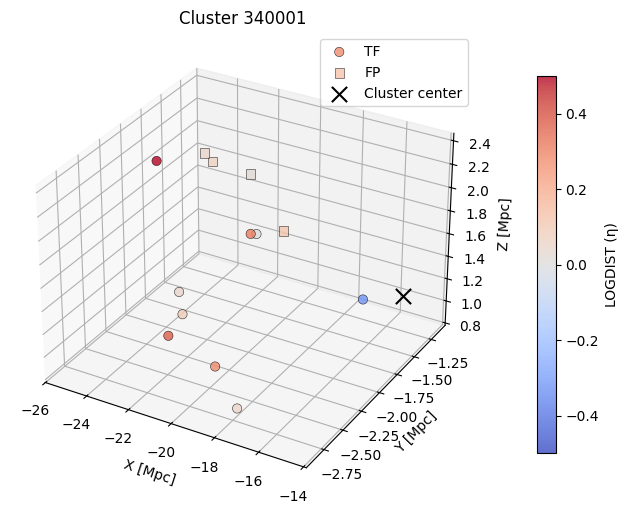

In [85]:
for cluster_id in good_clusters:

    if (np.sum(caltab['CLUSTER_ID'] == cluster_id) == 0 or
        np.sum(FP_cluster['CLUSTER_ID'] == cluster_id) == 0):
        continue

    fig = plot_cluster_3d_physical_cosmo(
        clusters,
        cluster_id,
        caltab,
        FP_cluster,
        vmin=vmin,
        vmax=vmax
    )

    plt.show()